# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib
import pickle

from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

from src.lightgbm_wrapper.feature_engineer import add_time_features, add_lag_features, add_rolling_features
from src.lightgbm_wrapper.station_embedding import learn_station_embeddings, attach_station_embedding
from src.lightgbm_wrapper.plot import plot_1_data, plot_2_data
from src.lightgbm_wrapper.model import build_supervised_for_horizon, train_test_validation_split, train_lgbm_for_horizon, plot_timeseries_example

try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

CMAQDATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/concentration_station"

PM_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

CMAQ_COLS = [
    "NO2_cmaq",
    "O3_cmaq",
    "SO2_cmaq"
]

BASE_FEATURE_COLS = PM_COLS + CMAQ_COLS

# Define lag and rolling windows for feature engineering
LAG_STEPS = [3, 6, 12, 24, 48, 72]
ROLL_WINDOWS = [3, 6, 12, 24, 48, 72]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

RANDOM_STATE = 42

'''
# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")
    f.write(f"RANDOM_STATE: {RANDOM_STATE}\n")
'''
    
# Store the results in one directory only, for testing API purpose
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_pmcmaqdata_test_models"
if os.path.isdir(LIGHTGBM_DIR):
    import shutil
    shutil.rmtree(LIGHTGBM_DIR)
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_pmcmaqdata_test_models


# Load dataset

## Method

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    if "date" in df.columns:
        df["date"] = pd.to_datetime(df["date"])
    elif "Date" in df.columns and "Time" in df.columns:
        df["date"] = pd.to_datetime((df["Date"] + " " + df["Time"]).astype('datetime64[ns]'), format="%y/%m/%d %H:%M:%S")
        df = df.drop(columns=["Date", "Time"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove "Unnamed" column
    for c in df.columns:
        if "Unnamed:" in c:
            df = df.drop(columns=[c])

    # Add station_id column
    if "Station" not in df.columns:
        df["station_id"] = station_id
    else:
        df = df.rename({"Station": "station_id"}, axis=1)
    return df

## CMAQ data

In [3]:
# Load dataset
dfs_cmaq = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, CMAQDATA_DIR)
    dfs_cmaq.append(df_sid)
df_cmaq = pd.concat(dfs_cmaq, ignore_index=True)

# Rename columns
df_cmaq = df_cmaq.rename({c: f"{c}_cmaq" for c in df_cmaq.columns if c not in ["date", "station_id"]}, axis=1)

# Sort data by station then date
df_cmaq = df_cmaq.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_cmaq = df_cmaq.loc[:, ["date"] + CMAQ_COLS + ["station_id"]]

display(df_cmaq)

# Convert unit
df_cmaq["NO2_cmaq"] = df_cmaq["NO2_cmaq"] * 1883.2
df_cmaq["O3_cmaq"] = df_cmaq["O3_cmaq"] * 1960
df_cmaq["SO2_cmaq"] = df_cmaq["SO2_cmaq"] * 2620

print(df_cmaq.shape)
print(df_cmaq.columns)
df_cmaq

,date,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,0.000072,0.096425,0.000027,211
1,2022-01-01 08:00:00,0.000074,0.077419,0.000038,211
2,2022-01-01 09:00:00,0.000055,0.061006,0.000050,211
3,2022-01-01 10:00:00,0.000040,0.048525,0.000057,211
4,2022-01-01 11:00:00,0.000034,0.029449,0.000047,211
...,...,...,...,...,...
44851,2022-12-31 01:00:00,0.002276,0.026421,0.000149,216
44852,2022-12-31 02:00:00,0.002208,0.026171,0.000148,216
44853,2022-12-31 03:00:00,0.002249,0.026087,0.000151,216
44854,2022-12-31 04:00:00,0.002680,0.026347,0.000166,216


(44856, 5)
Index(['date', 'NO2_cmaq', 'O3_cmaq', 'SO2_cmaq', 'station_id'], dtype='object')


,date,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,0.063087,57.721016,0.122092,211
...,...,...,...,...,...
44851,2022-12-31 01:00:00,4.285888,51.784937,0.389183,216
44852,2022-12-31 02:00:00,4.157322,51.295325,0.386550,216
44853,2022-12-31 03:00:00,4.235773,51.130547,0.394695,216
44854,2022-12-31 04:00:00,5.047855,51.640614,0.435544,216


## PM data

In [4]:
# Load dataset
dfs_pm = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs_pm.append(df_sid)
df_pm = pd.concat(dfs_pm, ignore_index=True)

# Sort data by station then date
df_pm = df_pm.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_pm = df_pm.loc[:, ["date"] + PM_COLS + ["station_id"]]

print(df_pm.shape)
print(df_pm.columns)
df_pm

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.740762,15.604762,55.431381,90.000000,28.361905,63.188095,211
1,2021-02-23 22:00:00,112.366471,14.594118,58.197176,1200.603529,28.320588,63.773529,211
2,2021-02-23 23:00:00,112.700433,13.436667,55.029433,1177.897000,28.336667,64.205000,211
3,2021-02-24 00:00:00,112.480867,12.365000,54.767700,90.000000,28.305000,64.735000,211
4,2021-02-24 01:00:00,114.331500,11.636667,53.786200,90.000000,28.300000,65.188333,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.088233,41.450000,75.916667,2.087167,27.690000,67.290000,216
92962,2022-12-31 20:00:00,0.083217,50.530000,66.116667,2.006500,27.401667,68.026667,216
92963,2022-12-31 21:00:00,0.084300,55.055000,55.133333,2.418833,27.603333,66.965000,216
92964,2022-12-31 22:00:00,0.066650,26.078333,46.750000,1.481500,27.036667,63.361667,216


## Merge 2 data

In [5]:
dfs_all = []
for station in STATION_IDS:
    df_pm_station = df_pm[df_pm["station_id"] == station]
    df_cmaq_station = df_cmaq[df_cmaq["station_id"] == station]
    df_joined = pd.merge(df_pm_station.drop(columns=["station_id"]), df_cmaq_station, on='date', how='inner')
    dfs_all.append(df_joined)
df_all = pd.concat(dfs_all, axis=0).reset_index(drop=True)
df_all

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211
...,...,...,...,...,...,...,...,...,...,...,...
43370,2022-12-31 01:00:00,0.049037,17.709259,31.425926,0.824074,26.659259,64.601852,4.285888,51.784937,0.389183,216
43371,2022-12-31 02:00:00,0.063288,22.803390,43.220339,0.717627,25.771186,66.067797,4.157322,51.295325,0.386550,216
43372,2022-12-31 03:00:00,0.069050,23.031667,48.866667,0.746167,25.178333,68.278333,4.235773,51.130547,0.394695,216
43373,2022-12-31 04:00:00,0.064600,22.331667,50.633333,0.617667,24.950000,68.225000,5.047855,51.640614,0.435544,216


In [6]:
df_all.isnull().sum()

date                        0
NO2_quantrac            27391
PM25_quantrac           27393
O3_quantrac             30277
CO_quantrac             27407
Temperature_quantrac    35140
Humid_quantrac          35140
NO2_cmaq                    0
O3_cmaq                     0
SO2_cmaq                    0
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [7]:
df_dropped = df_all.dropna().reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211
...,...,...,...,...,...,...,...,...,...,...,...
8228,2022-12-31 01:00:00,0.049037,17.709259,31.425926,0.824074,26.659259,64.601852,4.285888,51.784937,0.389183,216
8229,2022-12-31 02:00:00,0.063288,22.803390,43.220339,0.717627,25.771186,66.067797,4.157322,51.295325,0.386550,216
8230,2022-12-31 03:00:00,0.069050,23.031667,48.866667,0.746167,25.178333,68.278333,4.235773,51.130547,0.394695,216
8231,2022-12-31 04:00:00,0.064600,22.331667,50.633333,0.617667,24.950000,68.225000,5.047855,51.640614,0.435544,216


## Update the STATION_IDS after dropping missing

In [8]:
STATION_IDS = list(df_dropped["station_id"].unique())
STATION_IDS

[211, 212, 213, 216]

## Visualization

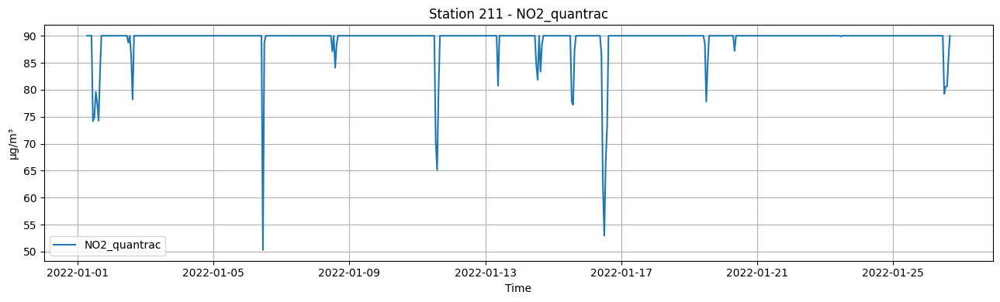

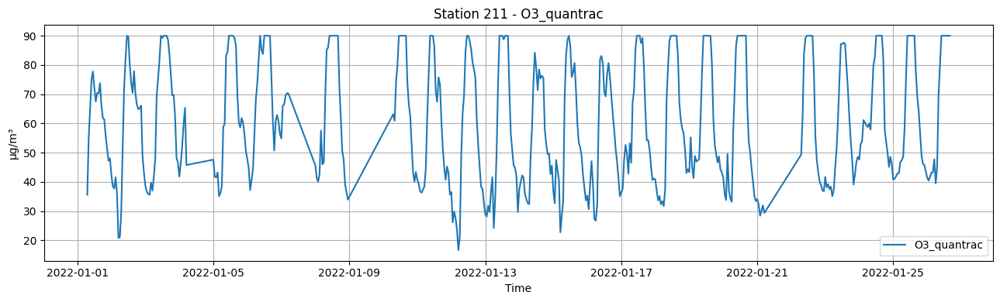

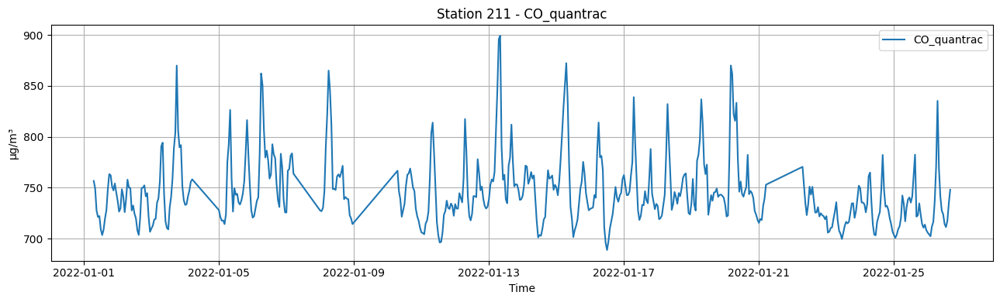

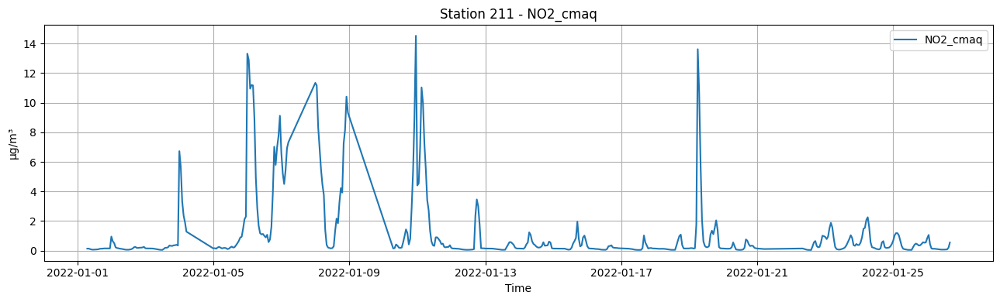

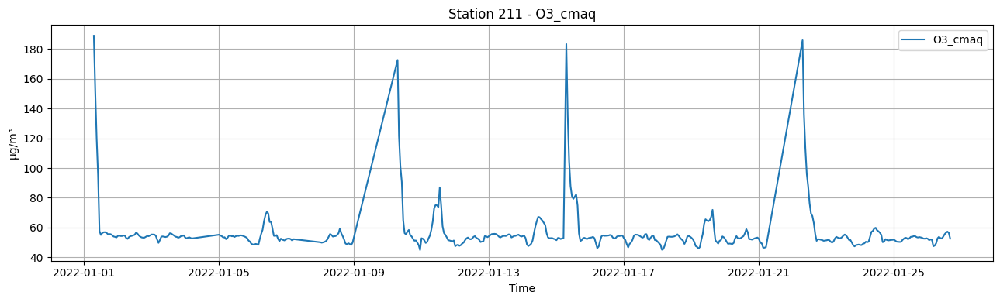

...

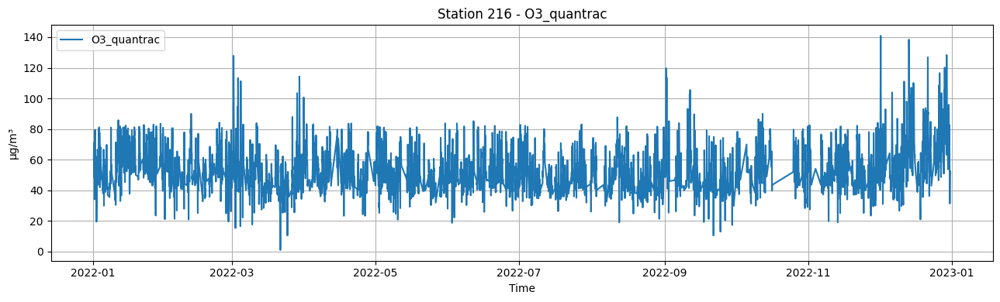

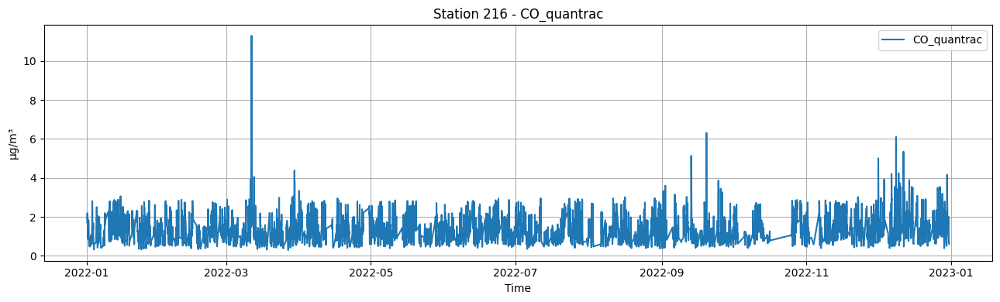

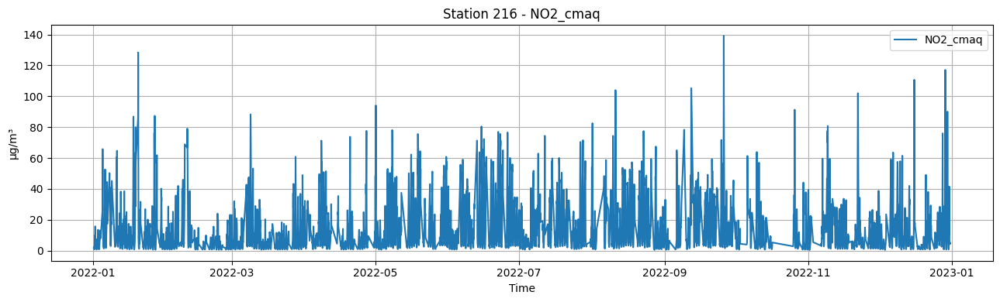

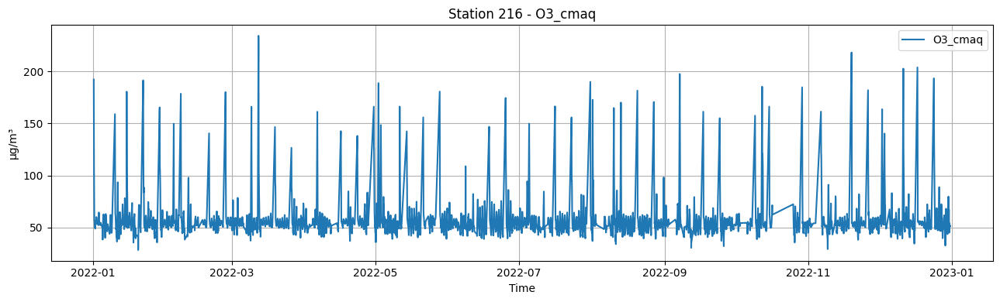

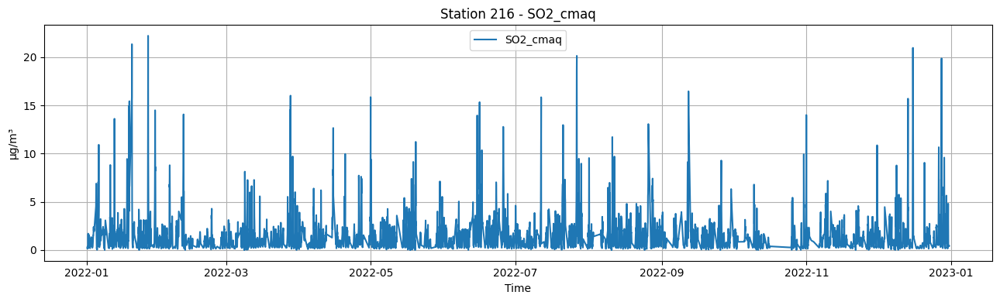

In [9]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [10]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id
0,2022-01-01 07:00:00,90.000000,22.783333,35.588975,756.627400,24.661667,73.355000,0.136344,188.993157,0.071526,211
1,2022-01-01 08:00:00,90.000000,21.883333,55.011077,749.102000,27.258333,65.521667,0.138604,151.741122,0.100084,211
2,2022-01-01 09:00:00,90.000000,16.233333,64.729197,727.519000,29.250000,57.910000,0.104141,119.571595,0.130476,211
3,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211
4,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211
...,...,...,...,...,...,...,...,...,...,...,...
8228,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,216
8229,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,216
8230,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,216
8231,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,216


## Visualization after converting unit

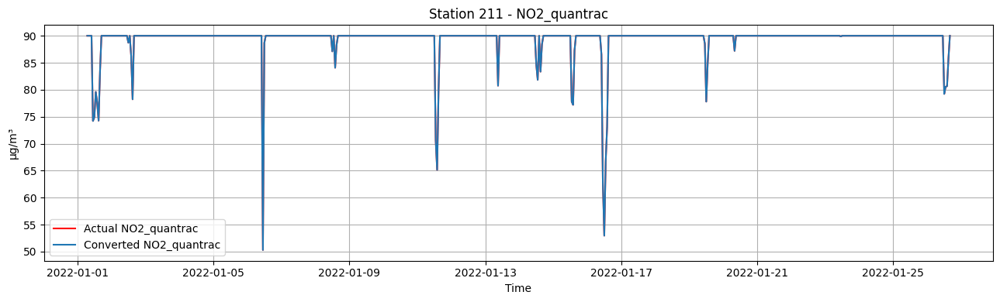

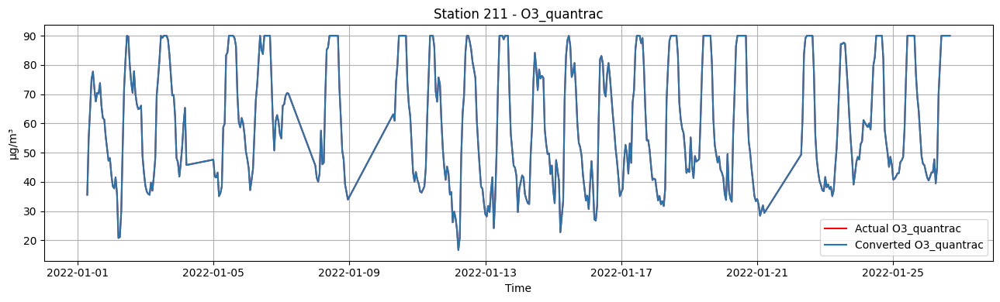

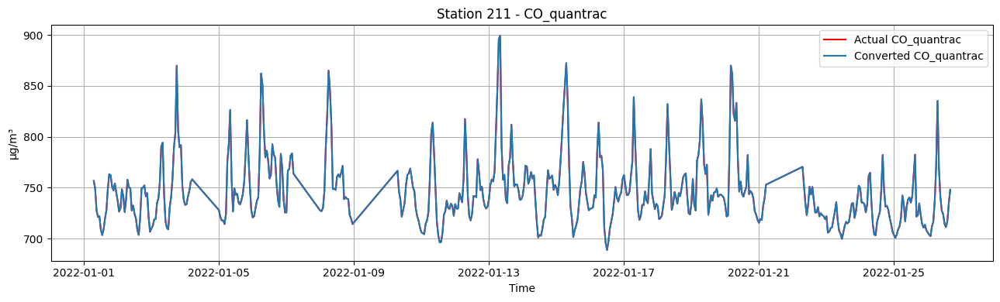

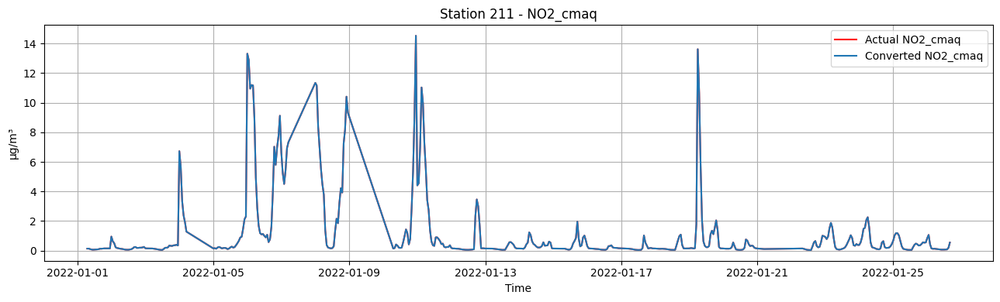

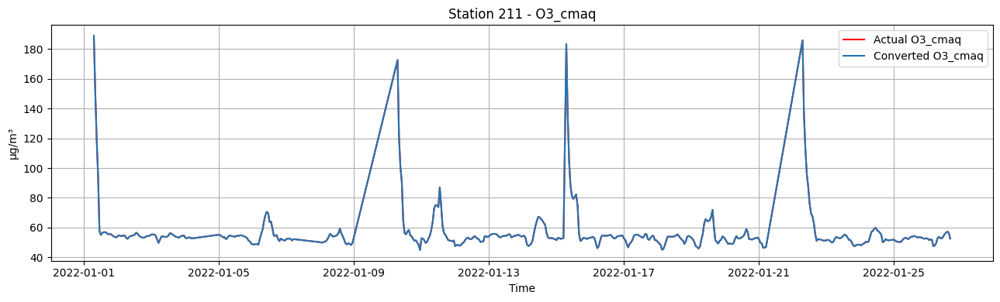

...

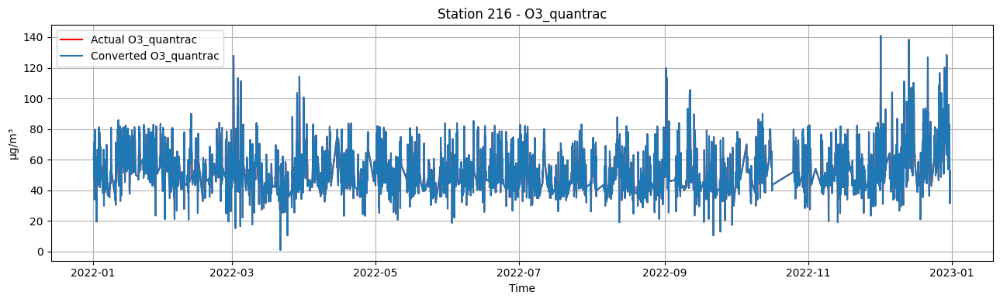

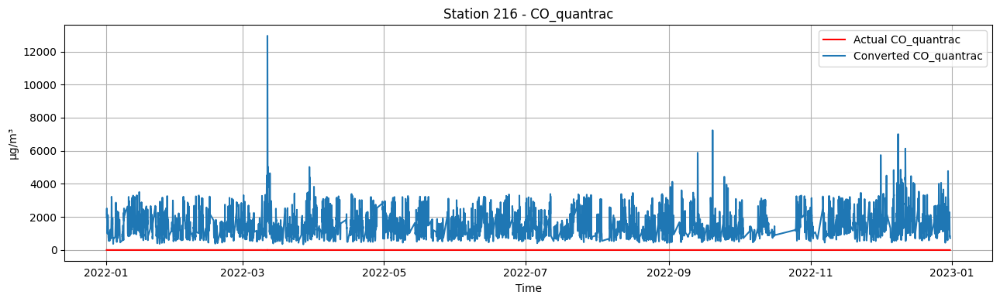

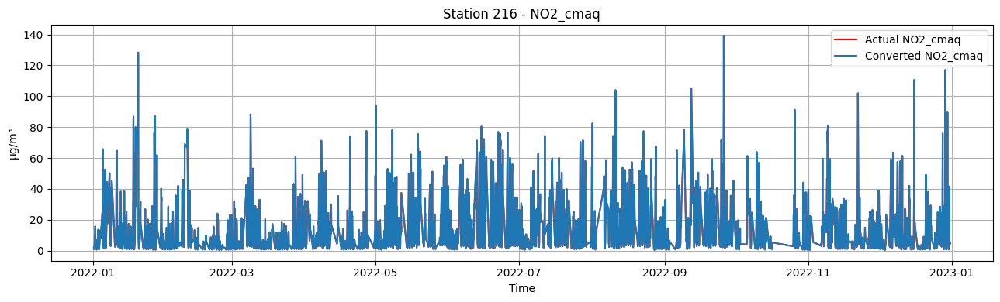

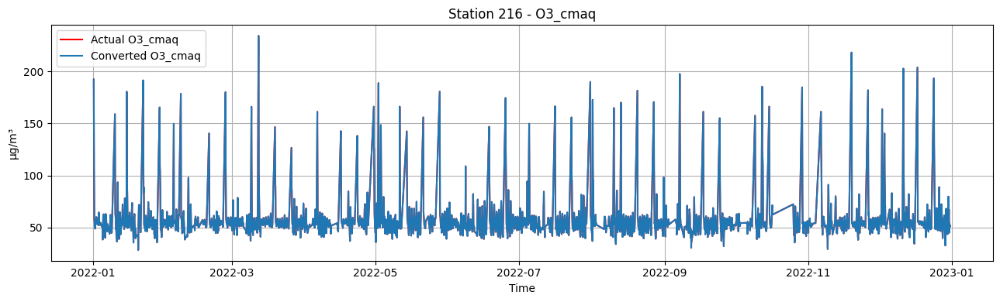

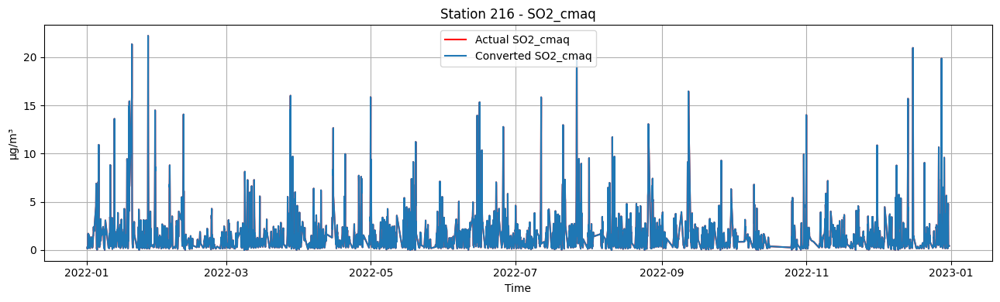

In [11]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [12]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

# CMAQ

# 211 NO2 cmaq
# 211 O3 cmaq
test211 = test[test["station_id"] == 211]
test = test.drop(index=test211[test211["NO2_cmaq"] > 10].index, errors="ignore")
test = test.drop(index=test211[test211["O3_cmaq"] > 100].index, errors="ignore")
test = test.drop(index=test211[test211["SO2_cmaq"] > 1.5].index, errors="ignore")

# 212 O3 cmaq
# 212 SO2 cmaq
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["O3_cmaq"] > 100].index, errors="ignore")
test = test.drop(index=test212[test212["SO2_cmaq"] > 25].index, errors="ignore")

# 213 NO2 cmaq
# 213 O3 cmaq
# 213 SO2 cmaq
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["NO2_cmaq"] > 80].index, errors="ignore")
test = test.drop(index=test213[test213["O3_cmaq"] > 140].index, errors="ignore")
test = test.drop(index=test213[test213["SO2_cmaq"] > 20].index, errors="ignore")

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 8233 records
After: 8180 records
Removed 53 records


## Visualization after removing outliers

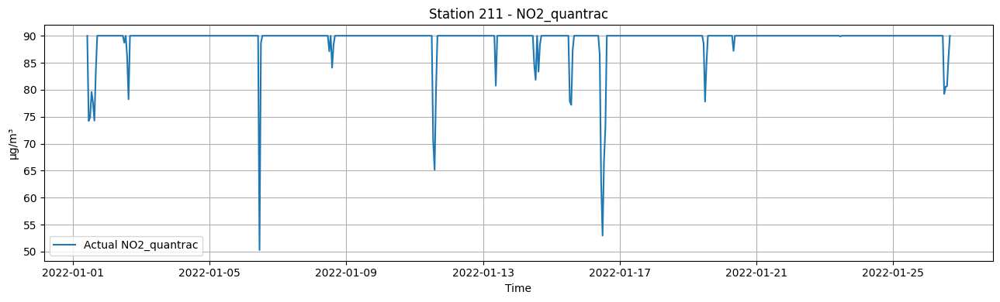

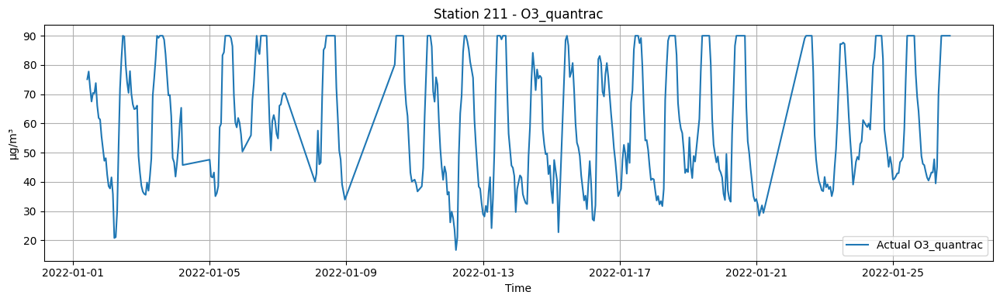

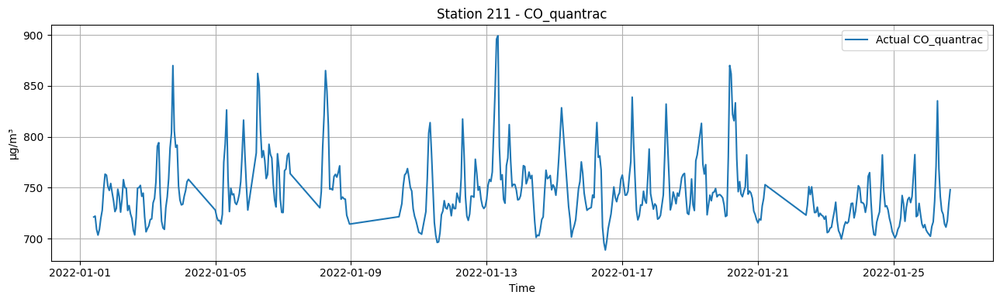

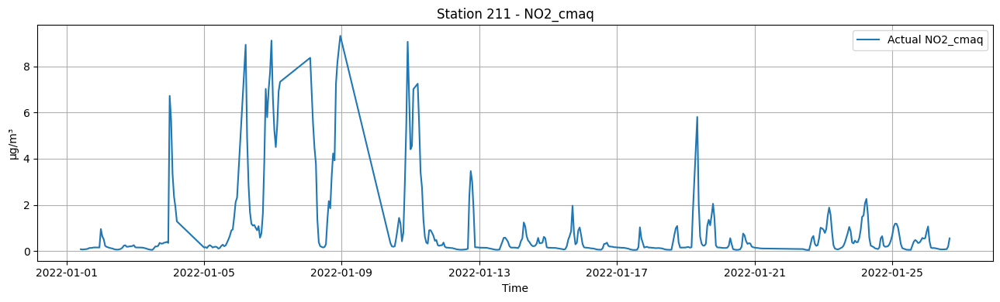

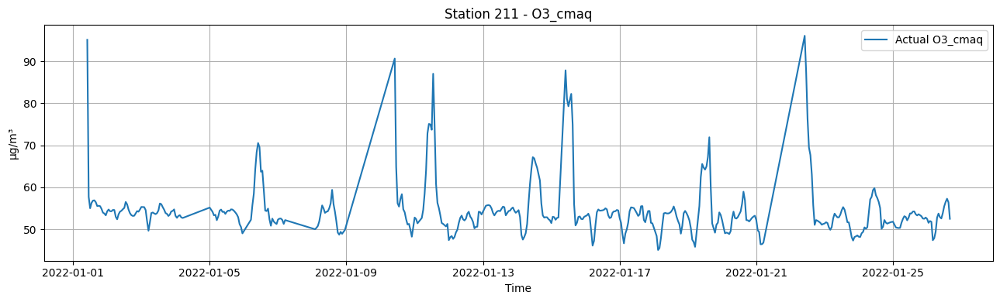

...

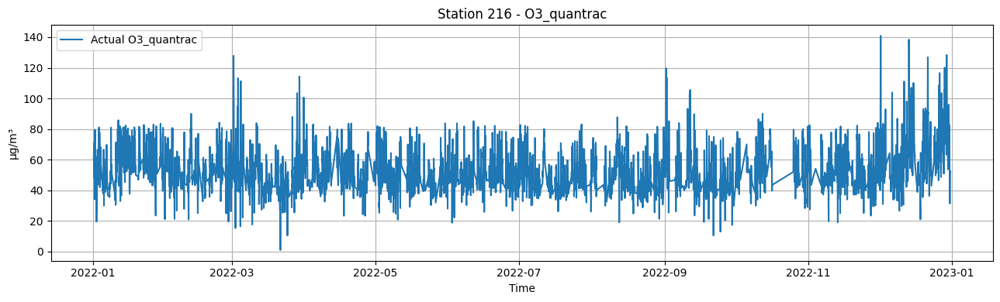

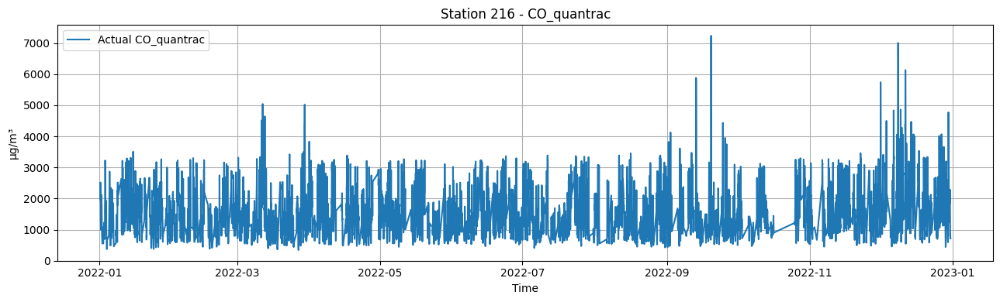

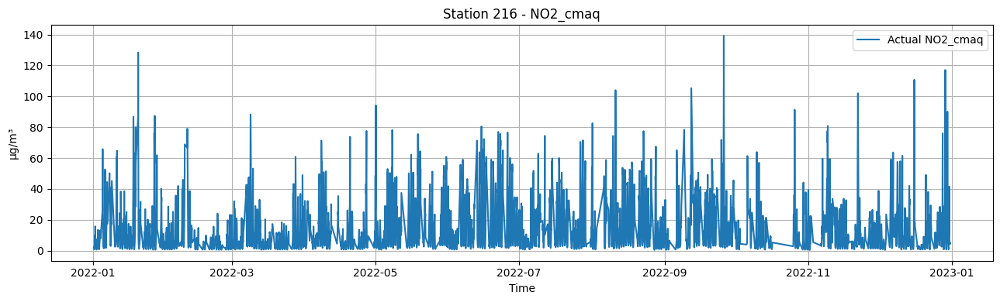

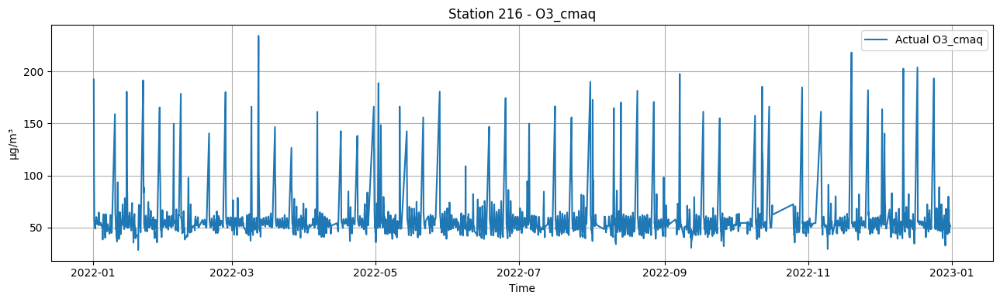

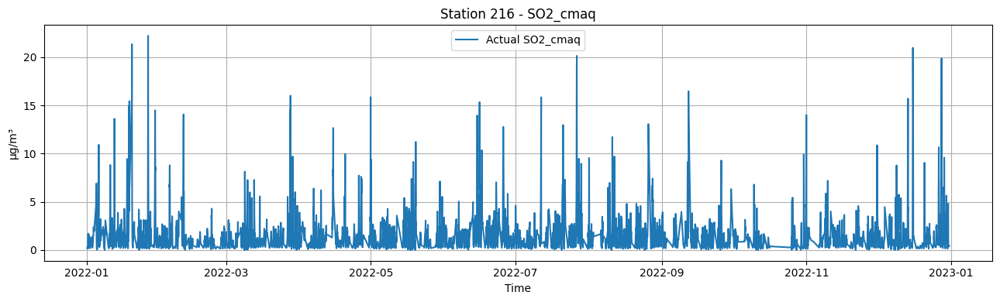

In [13]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

### Time features

In [14]:
# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(df_converted, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)
dftestno2 = add_rolling_features(df_converted, group_col="station_id", target_cols=["NO2_quantrac"], windows=ROLL_WINDOWS)
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(8180, 19)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_cmaq', 'O3_cmaq',
       'SO2_cmaq', 'station_id', 'NO2_quantrac_roll3_mean',
       'NO2_quantrac_roll3_std', 'NO2_quantrac_roll6_mean',
       'NO2_quantrac_roll6_std', 'NO2_quantrac_roll12_mean',
       'NO2_quantrac_roll12_std', 'NO2_quantrac_roll24_mean',
       'NO2_quantrac_roll24_std'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,station_id,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,211,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,211,90.000000,NaN,90.000000,NaN,90.000000,NaN,90.000000,NaN
2,2022-01-01 12:00:00,74.890246,11.833333,72.086817,709.030200,31.860000,49.410000,0.068737,55.009452,0.085674,211,82.103674,11.167091,82.103674,11.167091,82.103674,11.167091,82.103674,11.167091
3,2022-01-01 13:00:00,79.595678,7.900000,67.509674,703.414800,31.395000,50.456667,0.076458,56.294395,0.075980,211,79.699198,8.927288,79.699198,8.927288,79.699198,8.927288,79.699198,8.927288
4,2022-01-01 14:00:00,77.621284,8.366667,70.440426,708.858300,31.781667,51.025000,0.082672,56.840809,0.071788,211,76.231091,2.933756,79.673318,7.289284,79.673318,7.289284,79.673318,7.289284
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8175,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,216,162.467849,16.160517,167.076458,11.438594,151.443282,20.588002,157.199778,20.786118
8176,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,216,136.126298,40.487158,154.120158,32.318802,149.118635,25.435481,154.467975,24.639817
8177,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,216,118.448157,25.741473,145.145079,33.472296,146.514295,26.848976,153.499776,25.572650
8178,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,216,113.855242,19.401097,138.161545,31.048054,145.117588,27.265733,152.945279,25.944042


### Station embedding

In [15]:
test_station_to_embedding, _ = learn_station_embeddings(dftestno2, target_col="NO2_quantrac", station_col="station_id", embed_dim=4)
print(test_station_to_embedding)

dftestno2, _ = attach_station_embedding(dftestno2, test_station_to_embedding, station_col="station_id")
display(dftestno2)

[Embed] epoch 001 | train MSE=15436.7359 | val MSE=15811.8945
[Embed] epoch 010 | train MSE=15053.0295 | val MSE=15396.1133
[Embed] epoch 020 | train MSE=14280.3809 | val MSE=14559.7715
[Embed] epoch 030 | train MSE=12936.1257 | val MSE=13129.3506
[Embed] epoch 040 | train MSE=10979.7502 | val MSE=11084.4209
[Embed] epoch 050 | train MSE=8665.1180 | val MSE=8702.1592
{211: [0.014593521, -1.2980313, -1.8663046, 0.7495554], 212: [-1.1537478, -3.9342809, -2.7167745, 1.1594019], 213: [-2.5934203, -1.0340245, -3.056799, 1.349287], 216: [-2.6024287, -3.3043966, -3.4912176, 3.5754483]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,...,NaN,NaN,NaN,NaN,NaN,NaN,0.014594,-1.298031,-1.866305,0.749555
1,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,...,90.000000,NaN,90.000000,NaN,90.000000,NaN,0.014594,-1.298031,-1.866305,0.749555
2,2022-01-01 12:00:00,74.890246,11.833333,72.086817,709.030200,31.860000,49.410000,0.068737,55.009452,0.085674,...,82.103674,11.167091,82.103674,11.167091,82.103674,11.167091,0.014594,-1.298031,-1.866305,0.749555
3,2022-01-01 13:00:00,79.595678,7.900000,67.509674,703.414800,31.395000,50.456667,0.076458,56.294395,0.075980,...,79.699198,8.927288,79.699198,8.927288,79.699198,8.927288,0.014594,-1.298031,-1.866305,0.749555
4,2022-01-01 14:00:00,77.621284,8.366667,70.440426,708.858300,31.781667,51.025000,0.082672,56.840809,0.071788,...,79.673318,7.289284,79.673318,7.289284,79.673318,7.289284,0.014594,-1.298031,-1.866305,0.749555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8175,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,...,167.076458,11.438594,151.443282,20.588002,157.199778,20.786118,-2.602429,-3.304397,-3.491218,3.575448
8176,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,...,154.120158,32.318802,149.118635,25.435481,154.467975,24.639817,-2.602429,-3.304397,-3.491218,3.575448
8177,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,...,145.145079,33.472296,146.514295,26.848976,153.499776,25.572650,-2.602429,-3.304397,-3.491218,3.575448
8178,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,...,138.161545,31.048054,145.117588,27.265733,152.945279,25.944042,-2.602429,-3.304397,-3.491218,3.575448


## Build supervised from time-series

In [16]:
# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=72, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (7890, 22) (7890, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'NO2_cmaq', 'O3_cmaq',
       'SO2_cmaq', 'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac_roll24_mean', 'NO2_quantrac_roll24_std', 'station_emb_0',
       'station_emb_1', 'station_emb_2', 'station_emb_3'],
      dtype='object')
Index(['date', 'station_id', 'NO2_quantrac_t_plus_72h'], dtype='object')


,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2022-01-01 12:00:00,211,11.833333,72.086817,709.030200,31.860000,49.410000,0.068737,55.009452,0.085674,...,82.103674,11.167091,82.103674,11.167091,82.103674,11.167091,0.014594,-1.298031,-1.866305,0.749555
1,2022-01-01 13:00:00,211,7.900000,67.509674,703.414800,31.395000,50.456667,0.076458,56.294395,0.075980,...,79.699198,8.927288,79.699198,8.927288,79.699198,8.927288,0.014594,-1.298031,-1.866305,0.749555
2,2022-01-01 14:00:00,211,8.366667,70.440426,708.858300,31.781667,51.025000,0.082672,56.840809,0.071788,...,79.673318,7.289284,79.673318,7.289284,79.673318,7.289284,0.014594,-1.298031,-1.866305,0.749555
3,2022-01-01 15:00:00,211,8.450000,70.273672,719.821700,32.001667,49.851667,0.096796,56.897938,0.066810,...,79.262911,6.379061,79.262911,6.379061,79.262911,6.379061,0.014594,-1.298031,-1.866305,0.749555
4,2022-01-01 16:00:00,211,9.866667,73.807903,727.805500,31.581667,52.300000,0.130506,56.437004,0.034322,...,78.430289,6.059166,78.430289,6.059166,78.430289,6.059166,0.014594,-1.298031,-1.866305,0.749555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7885,2022-12-28 01:00:00,216,36.455000,71.900000,1250.967667,25.563333,78.383333,30.314140,41.167530,4.664907,...,168.033751,9.469346,151.461591,21.762316,161.247815,22.494585,-2.602429,-3.304397,-3.491218,3.575448
7886,2022-12-28 02:00:00,216,53.257407,65.388889,2324.818444,25.151852,79.572222,6.613904,44.155574,0.802737,...,168.488858,9.010355,155.094598,19.205420,159.987117,21.515841,-2.602429,-3.304397,-3.491218,3.575448
7887,2022-12-28 03:00:00,216,66.822034,66.677966,2334.612678,24.444068,82.755932,5.054940,47.539334,0.585151,...,171.436298,10.675101,160.659047,16.548023,159.738257,21.192842,-2.602429,-3.304397,-3.491218,3.575448
7888,2022-12-28 04:00:00,216,67.953333,63.100000,2828.582200,23.873333,85.566667,4.827790,49.557571,0.524293,...,175.398466,16.600625,167.238277,16.053255,160.097983,21.856660,-2.602429,-3.304397,-3.491218,3.575448


,date,station_id,NO2_quantrac_t_plus_72h
0,2022-01-01 12:00:00,211,90.000000
1,2022-01-01 13:00:00,211,90.000000
2,2022-01-01 14:00:00,211,90.000000
3,2022-01-01 15:00:00,211,90.000000
4,2022-01-01 16:00:00,211,90.000000
...,...,...,...
7885,2022-12-28 01:00:00,216,92.346548
7886,2022-12-28 02:00:00,216,119.184217
7887,2022-12-28 03:00:00,216,130.034960
7888,2022-12-28 04:00:00,216,121.654720


## Split train/validation/test for each station

In [17]:
# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
355,19.966667,44.278621,741.939500,25.538333,82.376667,0.155741,54.025587,0.166370,90.000000,0.000000,90.000000,0.000000,88.432086,3.670150,89.216043,2.661482,0.014594,-1.298031,-1.866305,0.749555
356,23.800000,43.220131,740.048600,24.866667,85.723333,0.151974,53.418367,0.165322,90.000000,0.000000,90.000000,0.000000,88.432086,3.670150,89.216043,2.661482,0.014594,-1.298031,-1.866305,0.749555
357,24.216667,41.524122,733.153500,24.635000,86.016667,0.147643,52.144722,0.170038,90.000000,0.000000,90.000000,0.000000,88.553533,3.698147,89.216043,2.661482,0.014594,-1.298031,-1.866305,0.749555
358,22.250000,35.910420,721.674400,24.271667,84.961667,0.139168,50.516562,0.178160,90.000000,0.000000,90.000000,0.000000,89.570823,1.486712,89.216043,2.661482,0.014594,-1.298031,-1.866305,0.749555
359,23.150000,33.811563,722.629400,23.910000,86.255000,0.131259,49.054698,0.181828,90.000000,0.000000,90.000000,0.000000,90.000000,0.000000,89.216043,2.661482,0.014594,-1.298031,-1.866305,0.749555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7885,36.455000,71.900000,1250.967667,25.563333,78.383333,30.314140,41.167530,4.664907,168.263920,11.260467,168.033751,9.469346,151.461591,21.762316,161.247815,22.494585,-2.602429,-3.304397,-3.491218,3.575448
7886,53.257407,65.388889,2324.818444,25.151852,79.572222,6.613904,44.155574,0.802737,161.955200,3.029911,168.488858,9.010355,155.094598,19.205420,159.987117,21.515841,-2.602429,-3.304397,-3.491218,3.575448
7887,66.822034,66.677966,2334.612678,24.444068,82.755932,5.054940,47.539334,0.585151,168.090712,13.369010,171.436298,10.675101,160.659047,16.548023,159.738257,21.192842,-2.602429,-3.304397,-3.491218,3.575448
7888,67.953333,63.100000,2828.582200,23.873333,85.566667,4.827790,49.557571,0.524293,182.533012,20.234834,175.398466,16.600625,167.238277,16.053255,160.097983,21.856660,-2.602429,-3.304397,-3.491218,3.575448


# LightGBM model

## Add time and lags features

In [18]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [19]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
no2_station_to_embedding, _ = learn_station_embeddings(df_no2, target_col=label, station_col="station_id", embed_dim=4)
df_no2, _ = attach_station_embedding(df_no2, no2_station_to_embedding, station_col="station_id")
print(no2_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_pmcmaq_station_embedding.pkl"), 'wb') as no2_emb_file:
    pickle.dump(no2_station_to_embedding, no2_emb_file)

# Print dataset
display(df_no2)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_pmcmaq_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
no2_df_metrics_all

[Embed] epoch 001 | train MSE=15436.7359 | val MSE=15811.8945
[Embed] epoch 010 | train MSE=15053.0295 | val MSE=15396.1133
[Embed] epoch 020 | train MSE=14280.3809 | val MSE=14559.7715
[Embed] epoch 030 | train MSE=12936.1257 | val MSE=13129.3506
[Embed] epoch 040 | train MSE=10979.7502 | val MSE=11084.4209
[Embed] epoch 050 | train MSE=8665.1180 | val MSE=8702.1592
{211: [0.014593521, -1.2980313, -1.8663046, 0.7495554], 212: [-1.1537478, -3.9342809, -2.7167745, 1.1594019], 213: [-2.5934203, -1.0340245, -3.056799, 1.349287], 216: [-2.6024287, -3.3043966, -3.4912176, 3.5754483]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,...,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,NO2_quantrac_roll48_mean,NO2_quantrac_roll48_std,NO2_quantrac_roll72_mean,NO2_quantrac_roll72_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,...,NaN,NaN,NaN,NaN,NaN,NaN,0.014594,-1.298031,-1.866305,0.749555
1,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,...,90.000000,NaN,90.000000,NaN,90.000000,NaN,0.014594,-1.298031,-1.866305,0.749555
2,2022-01-01 12:00:00,74.890246,11.833333,72.086817,709.030200,31.860000,49.410000,0.068737,55.009452,0.085674,...,82.103674,11.167091,82.103674,11.167091,82.103674,11.167091,0.014594,-1.298031,-1.866305,0.749555
3,2022-01-01 13:00:00,79.595678,7.900000,67.509674,703.414800,31.395000,50.456667,0.076458,56.294395,0.075980,...,79.699198,8.927288,79.699198,8.927288,79.699198,8.927288,0.014594,-1.298031,-1.866305,0.749555
4,2022-01-01 14:00:00,77.621284,8.366667,70.440426,708.858300,31.781667,51.025000,0.082672,56.840809,0.071788,...,79.673318,7.289284,79.673318,7.289284,79.673318,7.289284,0.014594,-1.298031,-1.866305,0.749555
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8175,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,...,157.199778,20.786118,153.237924,33.011382,154.749098,39.574038,-2.602429,-3.304397,-3.491218,3.575448
8176,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,...,154.467975,24.639817,151.940754,34.159644,153.783619,40.240440,-2.602429,-3.304397,-3.491218,3.575448
8177,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,...,153.499776,25.572650,151.240772,34.484712,152.891211,40.285988,-2.602429,-3.304397,-3.491218,3.575448
8178,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,...,152.945279,25.944042,150.809173,34.620338,151.887524,39.936363,-2.602429,-3.304397,-3.491218,3.575448



===== Training LightGBM for horizon = 1h, target_col = NO2_quantrac =====

X.shape = (7888, 83)
y.shape = (7888, 3)

Number of features: 83

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_

,date,target
0,2022-01-24,90.000000
1,2022-01-25,90.000000
2,2022-01-26,87.889799


,date,target
0,2022-01-24,89.770842
1,2022-01-25,90.159123
2,2022-01-26,88.360090


sid = 212, grp =                    date  station_id      y_true     y_pred
781 2022-01-23 23:00:00         212   88.014867  91.026043
782 2022-01-24 00:00:00         212   89.363633  92.853585
783 2022-01-24 01:00:00         212   86.831586  93.822936
784 2022-01-24 02:00:00         212   88.924500  91.735769
785 2022-01-24 03:00:00         212   87.105233  90.560115
..                  ...         ...         ...        ...
841 2022-01-26 11:00:00         212   39.490633  36.175538
842 2022-01-26 12:00:00         212   32.088100  36.310237
843 2022-01-26 13:00:00         212   55.173967  44.779748
844 2022-01-26 14:00:00         212  112.763167  52.221703
845 2022-01-26 15:00:00         212   66.426152  65.504672

[65 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 1
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, n

,date,target
0,2022-01-24,77.564899
1,2022-01-25,62.508781
2,2022-01-26,67.953188


,date,target
0,2022-01-24,78.473450
1,2022-01-25,80.506919
2,2022-01-26,60.516338


sid = 213, grp =                     date  station_id     y_true     y_pred
1215 2022-01-23 22:00:00         213  84.219500  77.354053
1216 2022-01-23 23:00:00         213  73.335267  76.359217
1217 2022-01-24 00:00:00         213  68.595655  65.264339
1218 2022-01-24 01:00:00         213  75.499567  63.701588
1219 2022-01-24 02:00:00         213  55.581733  62.972364
...                  ...         ...        ...        ...
1276 2022-01-26 11:00:00         213  12.515300  25.225951
1277 2022-01-26 12:00:00         213   8.249433  26.020655
1278 2022-01-26 13:00:00         213  10.100067  37.570211
1279 2022-01-26 14:00:00         213  52.727367  40.139115
1280 2022-01-26 15:00:00         213  81.060429  65.622613

[66 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 2
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, n

,date,target
0,2022-01-24,62.723704
1,2022-01-25,67.646904
2,2022-01-26,46.361845


,date,target
0,2022-01-24,59.175439
1,2022-01-25,61.213943
2,2022-01-26,50.320826


sid = 216, grp =                     date  station_id      y_true      y_pred
6896 2022-11-13 01:00:00         216  164.026720  161.852433
6897 2022-11-13 02:00:00         216  149.871333  156.900532
6898 2022-11-13 03:00:00         216  144.472827  156.877918
6899 2022-11-13 04:00:00         216  146.575733  149.945678
6900 2022-11-13 05:00:00         216  143.845093  155.127263
...                  ...         ...         ...         ...
7883 2022-12-31 00:00:00         216   92.346548  144.018838
7884 2022-12-31 01:00:00         216  119.184217  124.048085
7885 2022-12-31 02:00:00         216  130.034960  137.444794
7886 2022-12-31 03:00:00         216  121.654720  144.249613
7887 2022-12-31 04:00:00         216  121.497787  146.838058

[992 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(2022, 11, 18), datetime.date(2022, 11, 19), datetime.da

,date,target
0,2022-11-13,127.870947
1,2022-11-14,136.955349
2,2022-11-15,136.683809
3,2022-11-16,142.816852
4,2022-11-17,152.204247
5,2022-11-19,136.834789
6,2022-11-20,129.321464
7,2022-11-21,141.523072
8,2022-11-22,154.247124
9,2022-11-23,142.379967


,date,target
0,2022-11-13,132.958268
1,2022-11-14,130.293349
2,2022-11-15,134.289764
3,2022-11-16,137.559259
4,2022-11-17,138.784731
5,2022-11-19,140.564282
6,2022-11-20,129.930916
7,2022-11-21,138.117033
8,2022-11-22,142.989523
9,2022-11-23,140.898676


Overall test metrics: {'rmse': 18.09, 'mae': 12.75, 'mape': 15.2, 'mnbe': -5.3, 'r': 0.9, 'n_samples': 1186}

===== Training LightGBM for horizon = 24h, target_col = NO2_quantrac =====

X.shape = (7796, 83)
y.shape = (7796, 3)

Number of features: 83

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72

,date,target
0,2022-01-23,90.000000
1,2022-01-24,90.000000
2,2022-01-25,88.013928


,date,target
0,2022-01-23,91.951931
1,2022-01-24,92.200111
2,2022-01-25,92.050463


sid = 212, grp =                    date  station_id      y_true     y_pred
739 2022-01-23 04:00:00         212   87.105233  90.514944
740 2022-01-23 05:00:00         212   88.987233  90.655699
741 2022-01-23 06:00:00         212   91.277000  91.201476
742 2022-01-23 07:00:00         212   85.976033  92.779490
743 2022-01-23 08:00:00         212   60.569033  87.833686
..                  ...         ...         ...        ...
795 2022-01-25 12:00:00         212   39.490633  63.914738
796 2022-01-25 13:00:00         212   32.088100  62.154620
797 2022-01-25 14:00:00         212   55.173967  68.545833
798 2022-01-25 15:00:00         212  112.763167  68.669979
799 2022-01-25 16:00:00         212   66.426152  73.131434

[61 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-23, number of records = 20
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, number of records = 17


,date,target
0,2022-01-23,75.543480
1,2022-01-24,63.868616
2,2022-01-25,67.069601


,date,target
0,2022-01-23,82.775384
1,2022-01-24,84.884423
2,2022-01-25,79.139215


sid = 213, grp =                     date  station_id     y_true     y_pred
1150 2022-01-23 03:00:00         213  55.581733  69.485678
1151 2022-01-23 04:00:00         213  64.583967  51.152525
1152 2022-01-23 05:00:00         213  78.604867  46.042891
1153 2022-01-23 06:00:00         213  62.262833  50.911243
1154 2022-01-23 07:00:00         213  52.790100  72.556529
...                  ...         ...        ...        ...
1207 2022-01-25 12:00:00         213  12.515300  47.181710
1208 2022-01-25 13:00:00         213   8.249433  52.917303
1209 2022-01-25 14:00:00         213  10.100067  55.593945
1210 2022-01-25 15:00:00         213  52.727367  59.814366
1211 2022-01-25 16:00:00         213  81.060429  62.654653

[62 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-23, number of records = 21
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, number of records = 17


,date,target
0,2022-01-23,60.871849
1,2022-01-24,68.142236
2,2022-01-25,47.815670


,date,target
0,2022-01-23,60.879277
1,2022-01-24,66.669550
2,2022-01-25,63.639891


sid = 216, grp =                     date  station_id      y_true      y_pred
6808 2022-11-12 06:00:00         216  143.845093  117.285309
6809 2022-11-12 07:00:00         216  150.499067  118.843130
6810 2022-11-12 08:00:00         216  137.002800  121.245134
6811 2022-11-12 09:00:00         216  110.229973  115.607855
6812 2022-11-12 10:00:00         216   87.882667  126.904572
...                  ...         ...         ...         ...
7791 2022-12-30 01:00:00         216   92.346548  127.902266
7792 2022-12-30 02:00:00         216  119.184217  125.285832
7793 2022-12-30 03:00:00         216  130.034960  125.629930
7794 2022-12-30 04:00:00         216  121.654720  124.951559
7795 2022-12-30 05:00:00         216  121.497787  126.560504

[988 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(2022, 11, 18), datetime.da

,date,target
0,2022-11-12,122.519983
1,2022-11-13,136.303123
2,2022-11-14,136.742304
3,2022-11-15,142.213967
4,2022-11-16,150.984090
5,2022-11-17,143.625446
6,2022-11-19,127.608955
7,2022-11-20,141.213129
8,2022-11-21,153.310755
9,2022-11-22,142.951466


,date,target
0,2022-11-12,121.525910
1,2022-11-13,124.961229
2,2022-11-14,126.223023
3,2022-11-15,125.796252
4,2022-11-16,127.828109
5,2022-11-17,126.282937
6,2022-11-19,130.071197
7,2022-11-20,127.786810
8,2022-11-21,127.059767
9,2022-11-22,131.296149


Overall test metrics: {'rmse': 29.37, 'mae': 22.58, 'mape': 24.38, 'mnbe': -4.42, 'r': 0.76, 'n_samples': 1171}

===== Training LightGBM for horizon = 48h, target_col = NO2_quantrac =====

X.shape = (7700, 83)
y.shape = (7700, 3)

Number of features: 83

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_la

,date,target
0,2022-01-22,90.000000
1,2022-01-23,90.000000
2,2022-01-24,88.013928


,date,target
0,2022-01-22,94.996586
1,2022-01-23,95.444957
2,2022-01-24,95.136430


sid = 212, grp =                    date  station_id      y_true     y_pred
695 2022-01-21 03:00:00         212   60.569033  99.209526
696 2022-01-21 04:00:00         212   62.451033  94.407826
697 2022-01-21 05:00:00         212   66.246400  87.580891
698 2022-01-22 11:00:00         212   43.631033  77.031793
699 2022-01-22 12:00:00         212   47.802800  73.338729
700 2022-01-22 13:00:00         212   59.377100  64.143567
701 2022-01-22 14:00:00         212   52.225500  56.961334
702 2022-01-22 15:00:00         212   59.973067  57.100311
703 2022-01-22 16:00:00         212   64.270300  60.442181
704 2022-01-22 17:00:00         212   77.914800  79.264589
705 2022-01-22 18:00:00         212   96.985733  80.845403
706 2022-01-22 19:00:00         212   90.210533  80.779403
707 2022-01-22 20:00:00         212   95.919267  82.676349
708 2022-01-22 21:00:00         212   93.253100  87.208388
709 2022-01-22 22:00:00         212   97.017100  87.933703
710 2022-01-22 23:00:00         212   8

,date,target
0,2022-01-22,74.481356
1,2022-01-23,63.868616
2,2022-01-24,67.069601


,date,target
0,2022-01-22,75.779088
1,2022-01-23,87.458554
2,2022-01-24,82.653985


sid = 213, grp =                     date  station_id     y_true     y_pred
1081 2022-01-21 03:00:00         213  62.262833  72.181048
1082 2022-01-21 04:00:00         213  52.790100  71.621955
1083 2022-01-21 05:00:00         213  84.501800  63.489987
1084 2022-01-22 09:00:00         213  55.079867  51.921409
1085 2022-01-22 10:00:00         213  41.090333  42.764372
1086 2022-01-22 11:00:00         213  22.678100  41.144594
1087 2022-01-22 12:00:00         213  30.958900  44.727067
1088 2022-01-22 13:00:00         213  13.240035  38.878767
1089 2022-01-22 14:00:00         213  32.500692  39.284865
1090 2022-01-22 15:00:00         213  12.651222  60.201774
1091 2022-01-22 16:00:00         213  64.897633  62.019974
1092 2022-01-22 17:00:00         213  78.698967  67.333954
1093 2022-01-22 18:00:00         213  70.642214  70.016487
1094 2022-01-22 19:00:00         213  90.241900  77.551342
1095 2022-01-22 20:00:00         213  98.240400  91.337625
1096 2022-01-22 21:00:00         213  8

,date,target
0,2022-01-22,58.665569
1,2022-01-23,68.142236
2,2022-01-24,47.815670


,date,target
0,2022-01-22,64.686220
1,2022-01-23,71.544179
2,2022-01-24,66.087153


sid = 216, grp =                     date  station_id      y_true      y_pred
6716 2022-11-10 16:00:00         216   87.882667  125.617607
6717 2022-11-10 17:00:00         216   66.472981  130.711517
6718 2022-11-10 18:00:00         216   86.889222  132.755876
6719 2022-11-10 19:00:00         216   71.969627  132.594525
6720 2022-11-10 20:00:00         216   87.066613  133.431722
...                  ...         ...         ...         ...
7695 2022-12-29 01:00:00         216   92.346548  124.266701
7696 2022-12-29 02:00:00         216  119.184217  119.835971
7697 2022-12-29 03:00:00         216  130.034960  121.442869
7698 2022-12-29 04:00:00         216  121.654720  119.446688
7699 2022-12-29 05:00:00         216  121.497787  118.819288

[984 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.da

,date,target
0,2022-11-12,136.303123
1,2022-11-13,136.742304
2,2022-11-14,142.213967
3,2022-11-15,150.984090
4,2022-11-16,143.625446
5,2022-11-17,129.321464
6,2022-11-19,147.122231
7,2022-11-20,153.310755
8,2022-11-21,142.951466
9,2022-11-22,140.126075


,date,target
0,2022-11-12,122.441501
1,2022-11-13,123.962991
2,2022-11-14,122.623079
3,2022-11-15,124.061259
4,2022-11-16,123.053414
5,2022-11-17,123.552230
6,2022-11-19,123.258199
7,2022-11-20,118.492874
8,2022-11-21,120.041466
9,2022-11-22,123.638606


Overall test metrics: {'rmse': 33.18, 'mae': 26.67, 'mape': 28.97, 'mnbe': -5.34, 'r': 0.68, 'n_samples': 1156}

===== Training LightGBM for horizon = 72h, target_col = NO2_quantrac =====

X.shape = (7604, 83)
y.shape = (7604, 3)

Number of features: 83

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_la

,date,target
0,2022-01-20,90.000000
1,2022-01-22,90.000000
2,2022-01-23,88.013928


,date,target
0,2022-01-20,95.443862
1,2022-01-22,95.049654
2,2022-01-23,95.056242


sid = 212, grp =                    date  station_id      y_true     y_pred
650 2022-01-20 06:00:00         212   43.631033  96.989091
651 2022-01-20 07:00:00         212   47.802800  91.909679
652 2022-01-20 08:00:00         212   59.377100  84.666857
653 2022-01-20 09:00:00         212   52.225500  74.359208
654 2022-01-20 10:00:00         212   59.973067  60.639145
655 2022-01-20 11:00:00         212   64.270300  57.119758
656 2022-01-20 12:00:00         212   77.914800  51.414527
657 2022-01-20 13:00:00         212   96.985733  53.309752
658 2022-01-20 14:00:00         212   90.210533  59.941255
659 2022-01-20 15:00:00         212   95.919267  67.952404
660 2022-01-20 16:00:00         212   93.253100  85.287070
661 2022-01-20 17:00:00         212   97.017100  96.845442
662 2022-01-20 18:00:00         212   89.677300  96.794691
663 2022-01-20 19:00:00         212   85.568267  96.928526
664 2022-01-20 20:00:00         212   84.815467  97.182335
665 2022-01-20 21:00:00         212   7

,date,target
0,2022-01-20,76.531422
1,2022-01-22,52.932214
2,2022-01-23,67.069601


,date,target
0,2022-01-20,81.353578
1,2022-01-22,77.383538
2,2022-01-23,82.025848


sid = 213, grp =                     date  station_id     y_true     y_pred
1013 2022-01-20 07:00:00         213  41.090333  61.753606
1014 2022-01-20 08:00:00         213  22.678100  42.041866
1015 2022-01-20 09:00:00         213  30.958900  41.394617
1016 2022-01-20 10:00:00         213  13.240035  39.257601
1017 2022-01-20 11:00:00         213  32.500692  43.240521
1018 2022-01-20 12:00:00         213  12.651222  47.238510
1019 2022-01-20 13:00:00         213  64.897633  55.298207
1020 2022-01-20 14:00:00         213  78.698967  56.774724
1021 2022-01-20 15:00:00         213  70.642214  70.927882
1022 2022-01-20 16:00:00         213  90.241900  82.191815
1023 2022-01-20 17:00:00         213  98.240400  85.394829
1024 2022-01-20 18:00:00         213  87.262067  90.890267
1025 2022-01-20 19:00:00         213  90.681033  93.908478
1026 2022-01-20 20:00:00         213  91.120167  92.640812
1027 2022-01-20 21:00:00         213  82.964833  94.965180
1028 2022-01-20 22:00:00         213  8

,date,target
0,2022-01-20,62.724701
1,2022-01-22,67.860738
2,2022-01-23,47.815670


,date,target
0,2022-01-20,70.037685
1,2022-01-22,69.752454
2,2022-01-23,70.546343


sid = 216, grp =                     date  station_id      y_true      y_pred
6623 2022-11-09 19:00:00         216   71.969627  133.458063
6624 2022-11-09 20:00:00         216   87.066613  135.517842
6625 2022-11-09 21:00:00         216  139.702053  129.640854
6626 2022-11-09 22:00:00         216  172.689440  131.760989
6627 2022-11-09 23:00:00         216  182.701787  131.984518
...                  ...         ...         ...         ...
7599 2022-12-28 01:00:00         216   92.346548  124.531546
7600 2022-12-28 02:00:00         216  119.184217  119.177419
7601 2022-12-28 03:00:00         216  130.034960  127.953329
7602 2022-12-28 04:00:00         216  121.654720  128.880332
7603 2022-12-28 05:00:00         216  121.497787  124.744509

[981 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 9), datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.dat

,date,target
0,2022-11-10,127.617733
1,2022-11-12,136.742304
2,2022-11-13,142.213967
3,2022-11-14,150.984090
4,2022-11-15,143.625446
5,2022-11-16,129.321464
6,2022-11-17,141.523072
7,2022-11-19,162.446018
8,2022-11-20,142.951466
9,2022-11-21,140.126075


,date,target
0,2022-11-10,120.883525
1,2022-11-12,122.167322
2,2022-11-13,121.757263
3,2022-11-14,119.984911
4,2022-11-15,119.449697
5,2022-11-16,118.991170
6,2022-11-17,121.157952
7,2022-11-19,120.239253
8,2022-11-20,116.223519
9,2022-11-21,117.360823


Overall test metrics: {'rmse': 35.56, 'mae': 28.76, 'mape': 30.84, 'mnbe': -4.96, 'r': 0.58, 'n_samples': 1143}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,2.01,1.35,1.52,-0.13,0.60,63,-0.15
1,211,24,3.47,2.64,3.02,-3.02,0.04,60,-3.07
2,211,48,6.26,5.84,6.61,-6.61,0.12,56,-6.56
3,211,72,6.28,5.79,6.56,-6.56,0.01,53,-6.55
4,212,1,16.82,11.58,18.92,-11.09,0.61,65,-6.34
5,212,24,21.63,16.46,29.88,-27.48,0.51,61,-20.16
6,212,48,25.31,20.46,37.75,-33.60,0.26,57,-20.64
7,212,72,26.46,21.45,37.52,-29.71,0.29,54,-24.93
8,213,1,16.84,13.24,39.86,-15.21,0.74,66,2.21
9,213,24,18.10,13.76,54.99,-41.33,0.69,62,-10.32


station_id = 211
hour = 1
X_test_sid.shape: (63, 81)
y_test_sid.shape: (63, 1)
y_pred_sid.shape: (63,)


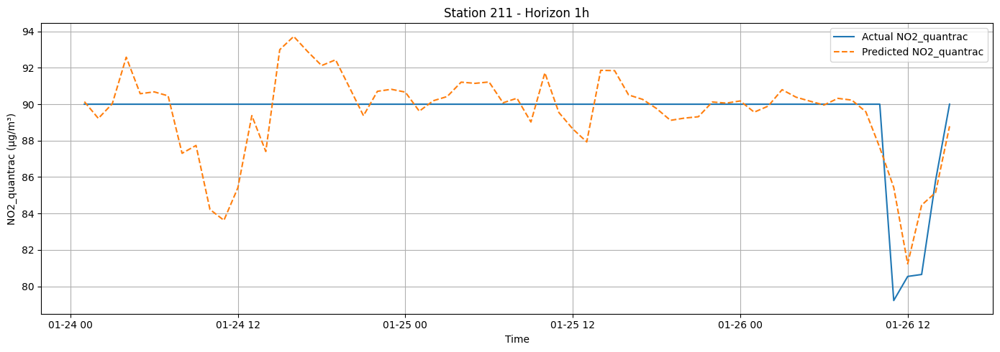

hour = 24
X_test_sid.shape: (60, 81)
y_test_sid.shape: (60, 1)
y_pred_sid.shape: (60,)


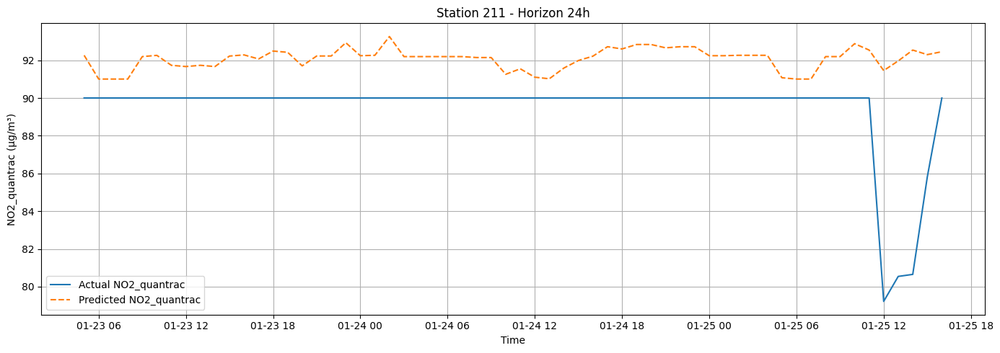

hour = 48
X_test_sid.shape: (56, 81)
y_test_sid.shape: (56, 1)
y_pred_sid.shape: (56,)


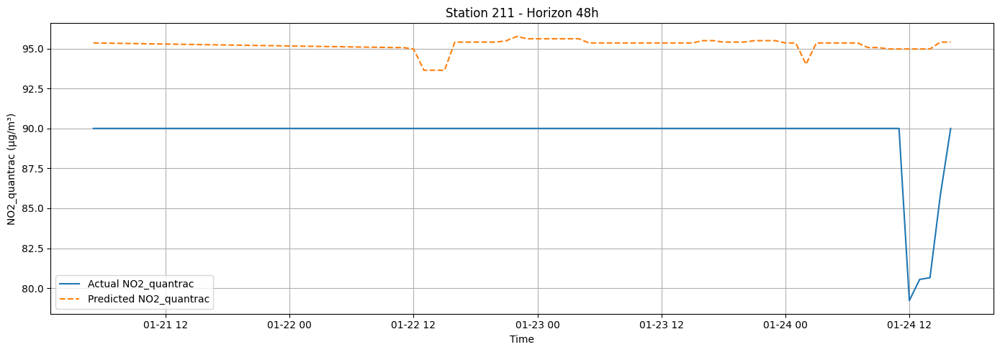

hour = 72
X_test_sid.shape: (53, 81)
y_test_sid.shape: (53, 1)
y_pred_sid.shape: (53,)


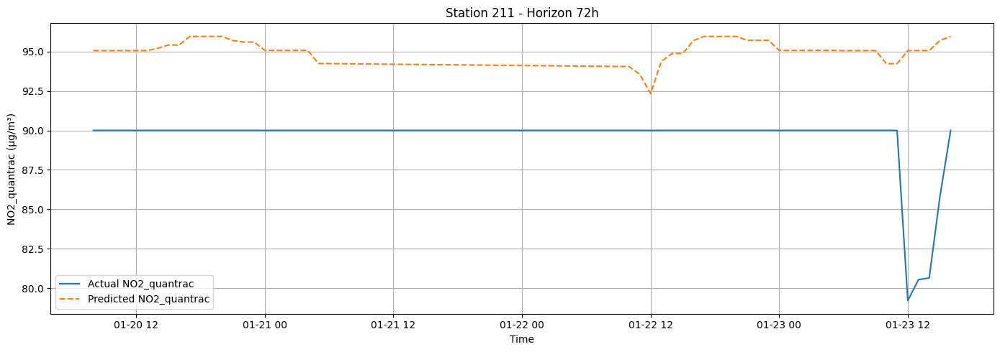

station_id = 212
hour = 1
X_test_sid.shape: (65, 81)
y_test_sid.shape: (65, 1)
y_pred_sid.shape: (65,)


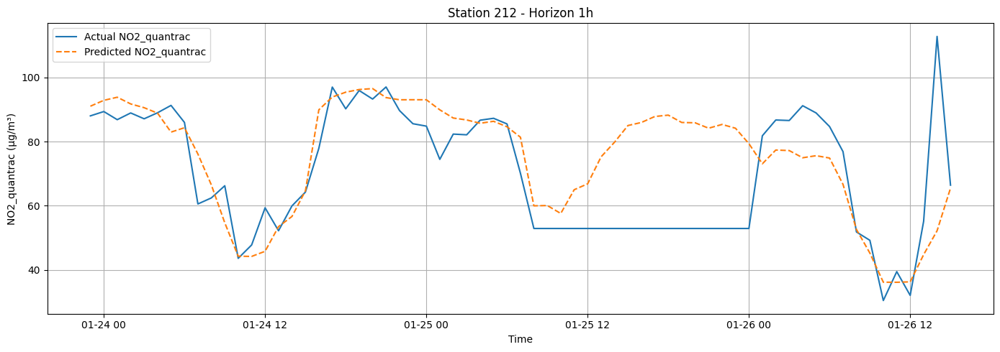

hour = 24
X_test_sid.shape: (61, 81)
y_test_sid.shape: (61, 1)
y_pred_sid.shape: (61,)


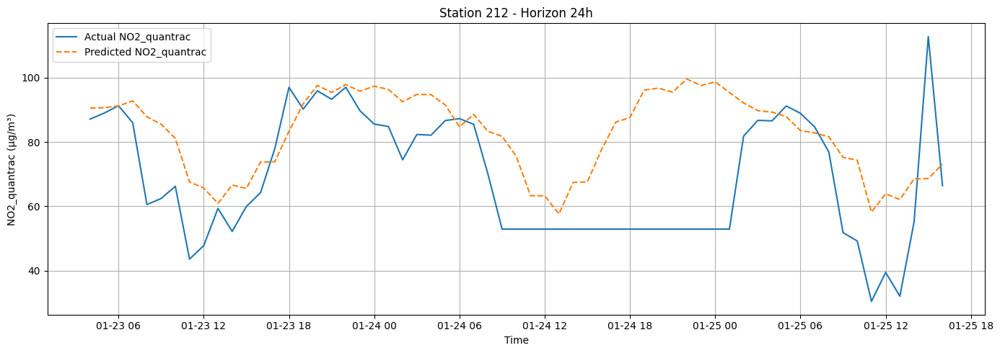

hour = 48
X_test_sid.shape: (57, 81)
y_test_sid.shape: (57, 1)
y_pred_sid.shape: (57,)


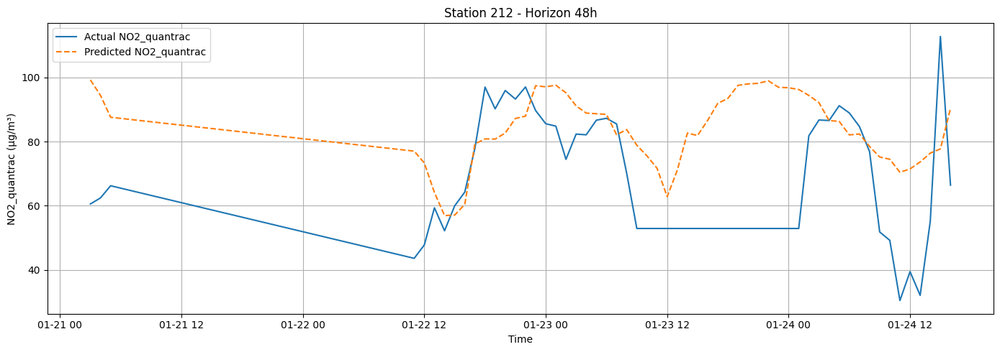

hour = 72
X_test_sid.shape: (54, 81)
y_test_sid.shape: (54, 1)
y_pred_sid.shape: (54,)


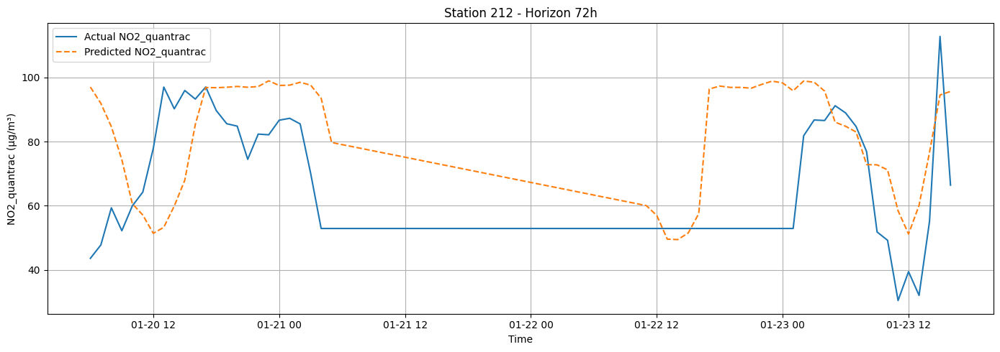

station_id = 213
hour = 1
X_test_sid.shape: (66, 81)
y_test_sid.shape: (66, 1)
y_pred_sid.shape: (66,)


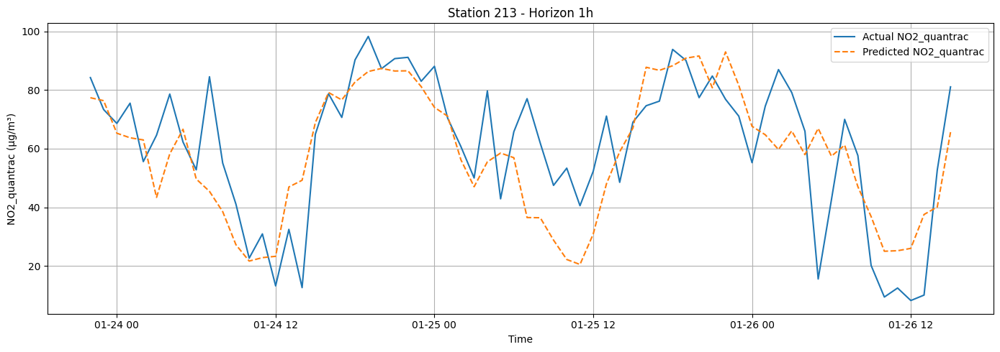

hour = 24
X_test_sid.shape: (62, 81)
y_test_sid.shape: (62, 1)
y_pred_sid.shape: (62,)


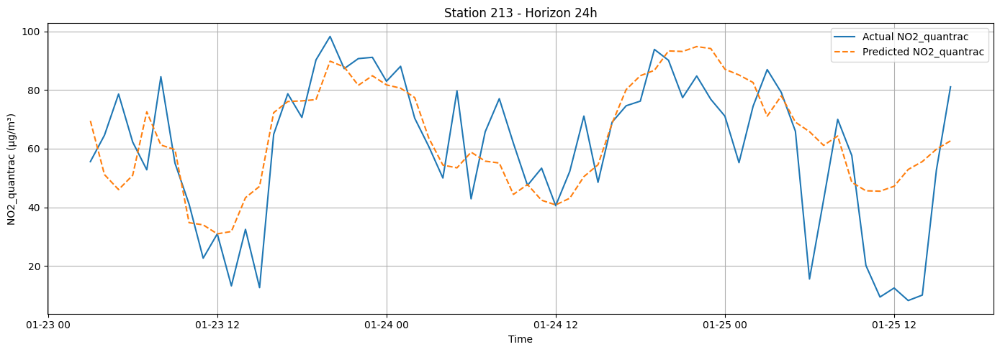

hour = 48
X_test_sid.shape: (59, 81)
y_test_sid.shape: (59, 1)
y_pred_sid.shape: (59,)


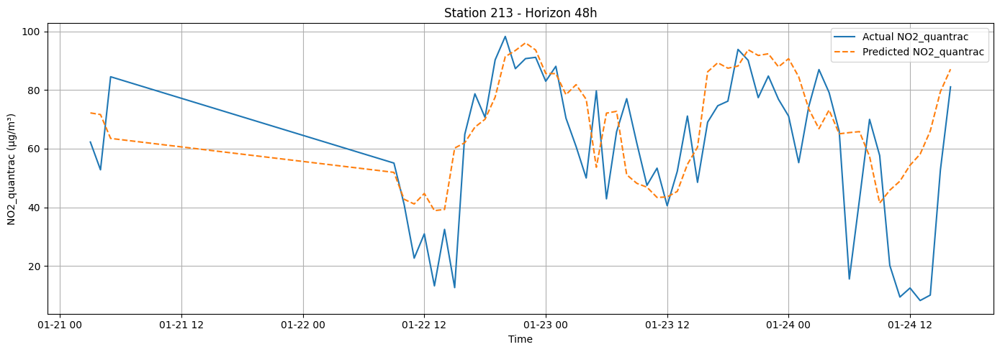

hour = 72
X_test_sid.shape: (55, 81)
y_test_sid.shape: (55, 1)
y_pred_sid.shape: (55,)


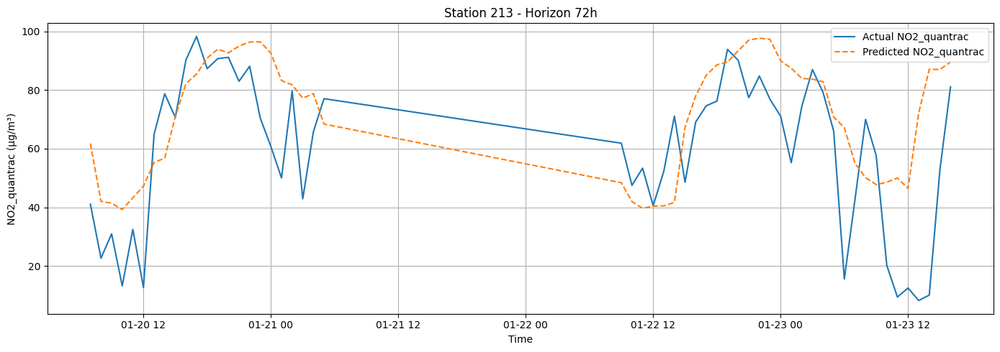

station_id = 216
hour = 1
X_test_sid.shape: (992, 81)
y_test_sid.shape: (992, 1)
y_pred_sid.shape: (992,)


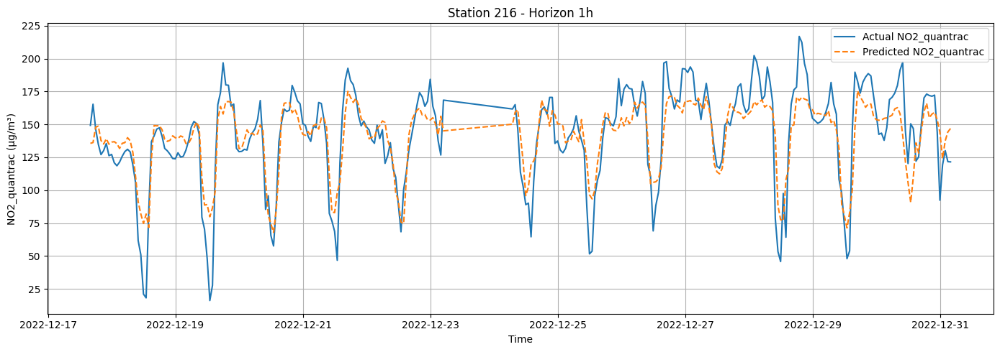

hour = 24
X_test_sid.shape: (988, 81)
y_test_sid.shape: (988, 1)
y_pred_sid.shape: (988,)


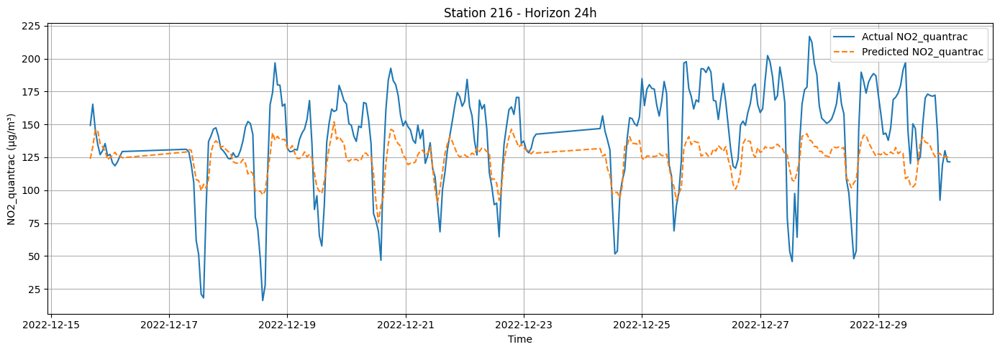

hour = 48
X_test_sid.shape: (984, 81)
y_test_sid.shape: (984, 1)
y_pred_sid.shape: (984,)


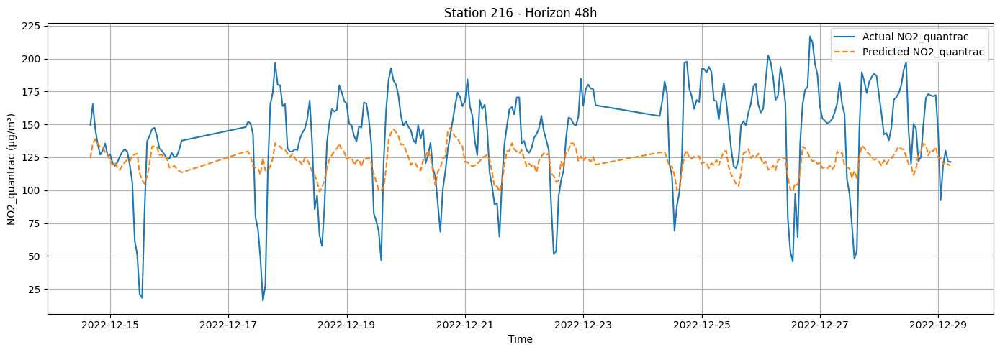

hour = 72
X_test_sid.shape: (981, 81)
y_test_sid.shape: (981, 1)
y_pred_sid.shape: (981,)


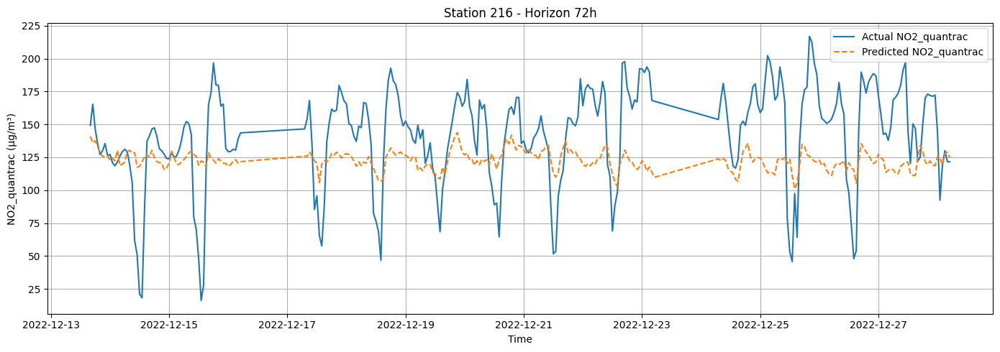

In [20]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for O3

In [21]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
o3_station_to_embedding, _ = learn_station_embeddings(df_o3, target_col=label, station_col="station_id", embed_dim=4)
df_o3, _ = attach_station_embedding(df_o3, o3_station_to_embedding, station_col="station_id")
print(o3_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_pmcmaq_station_embedding.pkl"), 'wb') as o3_emb_file:
    pickle.dump(o3_station_to_embedding, o3_emb_file)

# Print dataset
display(df_o3)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_pmcmaq_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
o3_df_metrics_all

[Embed] epoch 001 | train MSE=4045.7359 | val MSE=4020.4434
[Embed] epoch 010 | train MSE=3888.3236 | val MSE=3848.9031
[Embed] epoch 020 | train MSE=3548.8672 | val MSE=3485.2444
[Embed] epoch 030 | train MSE=3005.1669 | val MSE=2921.7417
[Embed] epoch 040 | train MSE=2300.3430 | val MSE=2206.2766
[Embed] epoch 050 | train MSE=1560.0285 | val MSE=1476.4227
{211: [4.1230297, -1.232479, -1.7944901, 0.69273704], 212: [2.8815582, -3.9663625, -2.748144, 1.2045305], 213: [1.4674233, -1.092761, -3.1146529, 1.4212213], 216: [1.3210824, -3.161988, -3.331023, 3.4352763]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,...,O3_quantrac_roll24_mean,O3_quantrac_roll24_std,O3_quantrac_roll48_mean,O3_quantrac_roll48_std,O3_quantrac_roll72_mean,O3_quantrac_roll72_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,...,NaN,NaN,NaN,NaN,NaN,NaN,4.123030,-1.232479,-1.794490,0.692737
1,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,...,75.109218,NaN,75.109218,NaN,75.109218,NaN,4.123030,-1.232479,-1.794490,0.692737
2,2022-01-01 12:00:00,74.890246,11.833333,72.086817,709.030200,31.860000,49.410000,0.068737,55.009452,0.085674,...,76.438511,1.879904,76.438511,1.879904,76.438511,1.879904,4.123030,-1.232479,-1.794490,0.692737
3,2022-01-01 13:00:00,79.595678,7.900000,67.509674,703.414800,31.395000,50.456667,0.076458,56.294395,0.075980,...,74.987946,2.842434,74.987946,2.842434,74.987946,2.842434,4.123030,-1.232479,-1.794490,0.692737
4,2022-01-01 14:00:00,77.621284,8.366667,70.440426,708.858300,31.781667,51.025000,0.082672,56.840809,0.071788,...,73.118378,4.400844,73.118378,4.400844,73.118378,4.400844,4.123030,-1.232479,-1.794490,0.692737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8175,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,...,72.275048,13.054325,76.282513,13.987620,76.901076,16.456236,1.321082,-3.161988,-3.331023,3.435276
8176,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,...,70.506530,15.478732,75.286178,15.403353,76.338936,17.299179,1.321082,-3.161988,-3.331023,3.435276
8177,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,...,69.563733,16.434445,74.575105,16.078964,76.031040,17.689691,1.321082,-3.161988,-3.331023,3.435276
8178,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,...,68.868594,16.956151,74.041960,16.501658,75.783661,17.945027,1.321082,-3.161988,-3.331023,3.435276



===== Training LightGBM for horizon = 1h, target_col = O3_quantrac =====

X.shape = (7888, 83)
y.shape = (7888, 3)

Number of features: 83

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_

,date,target
0,2022-01-24,65.943039
1,2022-01-25,61.589075
2,2022-01-26,67.551698


,date,target
0,2022-01-24,60.017998
1,2022-01-25,61.438493
2,2022-01-26,63.946063


sid = 212, grp =                    date  station_id      y_true      y_pred
781 2022-01-23 23:00:00         212  113.330533  129.582476
782 2022-01-24 00:00:00         212  108.194017  105.417546
783 2022-01-24 01:00:00         212  107.491172  108.078072
784 2022-01-24 02:00:00         212  103.482817  110.773873
785 2022-01-24 03:00:00         212  100.865483  105.227205
..                  ...         ...         ...         ...
841 2022-01-26 11:00:00         212  157.694333  132.522359
842 2022-01-26 12:00:00         212  153.539317  144.660994
843 2022-01-26 13:00:00         212   90.000000  136.328998
844 2022-01-26 14:00:00         212   90.000000  129.605425
845 2022-01-26 15:00:00         212   90.000000  125.820066

[65 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 1
Current date = 2022-01-24, number of records = 24
Current date = 2

,date,target
0,2022-01-24,117.172129
1,2022-01-25,91.615796
2,2022-01-26,101.975289


,date,target
0,2022-01-24,115.836562
1,2022-01-25,112.187611
2,2022-01-26,105.346964


sid = 213, grp =                     date  station_id     y_true      y_pred
1215 2022-01-23 22:00:00         213  91.541233   79.790884
1216 2022-01-23 23:00:00         213  77.342200   68.893921
1217 2022-01-24 00:00:00         213  77.166207   70.167068
1218 2022-01-24 01:00:00         213  83.656517   66.993894
1219 2022-01-24 02:00:00         213  63.699350   64.412325
...                  ...         ...        ...         ...
1276 2022-01-26 11:00:00         213  98.706183   87.901445
1277 2022-01-26 12:00:00         213  91.770250  101.361488
1278 2022-01-26 13:00:00         213  95.074633   99.331100
1279 2022-01-26 14:00:00         213  86.239958   98.301363
1280 2022-01-26 15:00:00         213  90.000000   96.402724

[66 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 2
Current date = 2022-01-24, number of records = 24
Current date = 2

,date,target
0,2022-01-24,87.420441
1,2022-01-25,84.291718
2,2022-01-26,67.773196


,date,target
0,2022-01-24,88.878005
1,2022-01-25,78.607152
2,2022-01-26,73.427940


sid = 216, grp =                     date  station_id     y_true     y_pred
6896 2022-11-13 01:00:00         216  51.716667  55.032328
6897 2022-11-13 02:00:00         216  48.316667  52.555729
6898 2022-11-13 03:00:00         216  45.366667  49.425713
6899 2022-11-13 04:00:00         216  47.650000  47.495431
6900 2022-11-13 05:00:00         216  46.016667  46.745703
...                  ...         ...        ...        ...
7883 2022-12-31 00:00:00         216  31.425926  50.666559
7884 2022-12-31 01:00:00         216  43.220339  48.847813
7885 2022-12-31 02:00:00         216  48.866667  50.204840
7886 2022-12-31 03:00:00         216  50.633333  46.661113
7887 2022-12-31 04:00:00         216  52.333333  47.186865

[992 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(2022, 11, 18), datetime.date(2022, 11, 19), datetime.date(2022, 11, 20), dateti

,date,target
0,2022-11-13,45.158823
1,2022-11-14,49.874950
2,2022-11-15,52.181892
3,2022-11-16,56.899045
4,2022-11-17,57.691762
5,2022-11-19,49.926471
6,2022-11-20,41.273951
7,2022-11-21,53.738353
8,2022-11-22,51.566107
9,2022-11-23,47.537124


,date,target
0,2022-11-13,49.444482
1,2022-11-14,50.998998
2,2022-11-15,51.924242
3,2022-11-16,55.749812
4,2022-11-17,54.260986
5,2022-11-19,51.749673
6,2022-11-20,44.985355
7,2022-11-21,52.370557
8,2022-11-22,54.039726
9,2022-11-23,48.938951


Overall test metrics: {'rmse': 12.73, 'mae': 8.68, 'mape': 13.92, 'mnbe': -1.83, 'r': 0.82, 'n_samples': 1186}

===== Training LightGBM for horizon = 24h, target_col = O3_quantrac =====

X.shape = (7796, 83)
y.shape = (7796, 3)

Number of features: 83

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag

,date,target
0,2022-01-23,68.454566
1,2022-01-24,61.561274
2,2022-01-25,66.017513


,date,target
0,2022-01-23,55.882260
1,2022-01-24,62.392644
2,2022-01-25,63.857966


sid = 212, grp =                    date  station_id      y_true      y_pred
739 2022-01-23 04:00:00         212  100.865483  116.292604
740 2022-01-23 05:00:00         212   95.859833  104.020806
741 2022-01-23 06:00:00         212  104.169867   98.412812
742 2022-01-23 07:00:00         212   98.673467   97.243992
743 2022-01-23 08:00:00         212   73.416200   98.452626
..                  ...         ...         ...         ...
795 2022-01-25 12:00:00         212  157.694333  132.998834
796 2022-01-25 13:00:00         212  153.539317  133.996846
797 2022-01-25 14:00:00         212   90.000000  124.830366
798 2022-01-25 15:00:00         212   90.000000  127.662276
799 2022-01-25 16:00:00         212   90.000000  112.135698

[61 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-23, number of records = 20
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, number of record

,date,target
0,2022-01-23,119.132124
1,2022-01-24,92.462487
2,2022-01-25,101.270861


,date,target
0,2022-01-23,113.096083
1,2022-01-24,112.773369
2,2022-01-25,112.103634


sid = 213, grp =                     date  station_id     y_true      y_pred
1150 2022-01-23 03:00:00         213  63.699350   70.066639
1151 2022-01-23 04:00:00         213  76.557000   65.344593
1152 2022-01-23 05:00:00         213  82.315133   48.161052
1153 2022-01-23 06:00:00         213  55.454750   62.057302
1154 2022-01-23 07:00:00         213  38.998267   59.293272
...                  ...         ...        ...         ...
1207 2022-01-25 12:00:00         213  98.706183   99.631691
1208 2022-01-25 13:00:00         213  91.770250  103.095575
1209 2022-01-25 14:00:00         213  95.074633  102.393350
1210 2022-01-25 15:00:00         213  86.239958  108.015881
1211 2022-01-25 16:00:00         213  90.000000  102.355440

[62 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-23, number of records = 21
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, number of record

,date,target
0,2022-01-23,88.553868
1,2022-01-24,85.008759
2,2022-01-25,67.341107


,date,target
0,2022-01-23,80.644267
1,2022-01-24,80.775112
2,2022-01-25,77.087598


sid = 216, grp =                     date  station_id     y_true     y_pred
6808 2022-11-12 06:00:00         216  46.016667  48.090708
6809 2022-11-12 07:00:00         216  48.116667  46.200787
6810 2022-11-12 08:00:00         216  47.466667  51.468500
6811 2022-11-12 09:00:00         216  38.916667  53.700017
6812 2022-11-12 10:00:00         216  30.816667  57.088622
...                  ...         ...        ...        ...
7791 2022-12-30 01:00:00         216  31.425926  60.779063
7792 2022-12-30 02:00:00         216  43.220339  58.293507
7793 2022-12-30 03:00:00         216  48.866667  53.000073
7794 2022-12-30 04:00:00         216  50.633333  49.444220
7795 2022-12-30 05:00:00         216  52.333333  50.511644

[988 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(2022, 11, 18), datetime.date(2022, 11, 19), dateti

,date,target
0,2022-11-12,44.555718
1,2022-11-13,49.765769
2,2022-11-14,52.277878
3,2022-11-15,56.538628
4,2022-11-16,57.187596
5,2022-11-17,51.871553
6,2022-11-19,41.868627
7,2022-11-20,53.461965
8,2022-11-21,51.504996
9,2022-11-22,47.732958


,date,target
0,2022-11-12,53.501342
1,2022-11-13,51.173018
2,2022-11-14,52.372979
3,2022-11-15,51.330540
4,2022-11-16,52.046121
5,2022-11-17,51.927804
6,2022-11-19,53.335570
7,2022-11-20,49.136708
8,2022-11-21,51.366025
9,2022-11-22,50.194086


Overall test metrics: {'rmse': 18.1, 'mae': 13.01, 'mape': 20.57, 'mnbe': -0.03, 'r': 0.62, 'n_samples': 1171}

===== Training LightGBM for horizon = 48h, target_col = O3_quantrac =====

X.shape = (7700, 83)
y.shape = (7700, 3)

Number of features: 83

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag

,date,target
0,2022-01-22,71.135340
1,2022-01-23,61.561274
2,2022-01-24,66.017513


,date,target
0,2022-01-22,64.681243
1,2022-01-23,54.332184
2,2022-01-24,60.899812


sid = 212, grp =                    date  station_id      y_true      y_pred
695 2022-01-21 03:00:00         212   73.416200   99.169871
696 2022-01-21 04:00:00         212  107.506967   97.278743
697 2022-01-21 05:00:00         212  119.513983   93.204513
698 2022-01-22 11:00:00         212  124.192467  108.265549
699 2022-01-22 12:00:00         212  179.287333  111.935784
700 2022-01-22 13:00:00         212   90.000000  110.449485
701 2022-01-22 14:00:00         212   90.000000  112.998862
702 2022-01-22 15:00:00         212   90.000000  115.794487
703 2022-01-22 16:00:00         212   90.000000  113.742781
704 2022-01-22 17:00:00         212  183.475067  138.613734
705 2022-01-22 18:00:00         212  178.731150  149.036598
706 2022-01-22 19:00:00         212  147.355867  138.989001
707 2022-01-22 20:00:00         212  139.700167  141.125384
708 2022-01-22 21:00:00         212  135.937750  130.259134
709 2022-01-22 22:00:00         212  119.513983  114.665744
710 2022-01-22 23:00:00

,date,target
0,2022-01-22,129.433591
1,2022-01-23,92.462487
2,2022-01-24,101.270861


,date,target
0,2022-01-22,123.300772
1,2022-01-23,114.382775
2,2022-01-24,109.140915


sid = 213, grp =                     date  station_id      y_true      y_pred
1081 2022-01-21 03:00:00         213   55.454750   61.022451
1082 2022-01-21 04:00:00         213   38.998267   54.589012
1083 2022-01-21 05:00:00         213   77.865667   56.957563
1084 2022-01-22 09:00:00         213   92.261000   71.391953
1085 2022-01-22 10:00:00         213  104.889633   73.203150
1086 2022-01-22 11:00:00         213  117.812717   74.346895
1087 2022-01-22 12:00:00         213   70.707838   73.551096
1088 2022-01-22 13:00:00         213  132.967421   91.145364
1089 2022-01-22 14:00:00         213   71.825178   98.207891
1090 2022-01-22 15:00:00         213   99.240556  105.303352
1091 2022-01-22 16:00:00         213   90.000000  103.626077
1092 2022-01-22 17:00:00         213   90.000000  105.009830
1093 2022-01-22 18:00:00         213  123.949429  109.247197
1094 2022-01-22 19:00:00         213  113.166950  100.722952
1095 2022-01-22 20:00:00         213  104.595183   88.233815
1096 20

,date,target
0,2022-01-22,97.649404
1,2022-01-23,85.008759
2,2022-01-24,67.341107


,date,target
0,2022-01-22,88.287190
1,2022-01-23,73.386886
2,2022-01-24,74.411469


sid = 216, grp =                     date  station_id     y_true     y_pred
6716 2022-11-10 16:00:00         216  30.816667  57.440759
6717 2022-11-10 17:00:00         216  19.166667  56.500884
6718 2022-11-10 18:00:00         216  45.202924  54.245185
6719 2022-11-10 19:00:00         216  34.233333  52.807927
6720 2022-11-10 20:00:00         216  40.550000  52.110440
...                  ...         ...        ...        ...
7695 2022-12-29 01:00:00         216  31.425926  53.646838
7696 2022-12-29 02:00:00         216  43.220339  51.594802
7697 2022-12-29 03:00:00         216  48.866667  53.086428
7698 2022-12-29 04:00:00         216  50.633333  50.522677
7699 2022-12-29 05:00:00         216  52.333333  46.816340

[984 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), dateti

,date,target
0,2022-11-12,49.765769
1,2022-11-13,52.277878
2,2022-11-14,56.538628
3,2022-11-15,57.187596
4,2022-11-16,51.871553
5,2022-11-17,41.273951
6,2022-11-19,59.716170
7,2022-11-20,51.504996
8,2022-11-21,47.732958
9,2022-11-22,47.439583


,date,target
0,2022-11-12,50.243764
1,2022-11-13,50.366833
2,2022-11-14,51.939623
3,2022-11-15,50.092232
4,2022-11-16,50.680970
5,2022-11-17,49.425647
6,2022-11-19,49.288866
7,2022-11-20,46.470724
8,2022-11-21,48.620566
9,2022-11-22,48.056813


Overall test metrics: {'rmse': 18.49, 'mae': 13.56, 'mape': 21.35, 'mnbe': 1.05, 'r': 0.61, 'n_samples': 1156}

===== Training LightGBM for horizon = 72h, target_col = O3_quantrac =====

X.shape = (7604, 83)
y.shape = (7604, 3)

Number of features: 83

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag

,date,target
0,2022-01-20,62.502574
1,2022-01-22,70.824489
2,2022-01-23,66.017513


,date,target
0,2022-01-20,60.664868
1,2022-01-22,62.795853
2,2022-01-23,59.937207


sid = 212, grp =                    date  station_id      y_true      y_pred
650 2022-01-20 06:00:00         212  124.192467   90.837783
651 2022-01-20 07:00:00         212  179.287333   97.922381
652 2022-01-20 08:00:00         212   90.000000  102.182398
653 2022-01-20 09:00:00         212   90.000000  112.060152
654 2022-01-20 10:00:00         212   90.000000  112.671770
655 2022-01-20 11:00:00         212   90.000000  136.823220
656 2022-01-20 12:00:00         212  183.475067  143.579068
657 2022-01-20 13:00:00         212  178.731150  141.253269
658 2022-01-20 14:00:00         212  147.355867  136.183766
659 2022-01-20 15:00:00         212  139.700167  129.337771
660 2022-01-20 16:00:00         212  135.937750  127.075037
661 2022-01-20 17:00:00         212  119.513983  129.085949
662 2022-01-20 18:00:00         212  114.442900  127.912606
663 2022-01-20 19:00:00         212  110.320600  135.101356
664 2022-01-20 20:00:00         212  106.165583  122.137842
665 2022-01-20 21:00:00

,date,target
0,2022-01-20,122.349830
1,2022-01-22,90.000000
2,2022-01-23,101.270861


,date,target
0,2022-01-20,120.828105
1,2022-01-22,117.172527
2,2022-01-23,114.920094


sid = 213, grp =                     date  station_id      y_true      y_pred
1013 2022-01-20 07:00:00         213  104.889633   56.725366
1014 2022-01-20 08:00:00         213  117.812717   60.824462
1015 2022-01-20 09:00:00         213   70.707838   72.603858
1016 2022-01-20 10:00:00         213  132.967421   93.442893
1017 2022-01-20 11:00:00         213   71.825178  104.013131
1018 2022-01-20 12:00:00         213   99.240556  103.172717
1019 2022-01-20 13:00:00         213   90.000000  105.789371
1020 2022-01-20 14:00:00         213   90.000000  104.136739
1021 2022-01-20 15:00:00         213  123.949429   97.864097
1022 2022-01-20 16:00:00         213  113.166950  103.197489
1023 2022-01-20 17:00:00         213  104.595183  100.385876
1024 2022-01-20 18:00:00         213   83.918250  103.658400
1025 2022-01-20 19:00:00         213   79.795950   93.052465
1026 2022-01-20 20:00:00         213   89.610950   93.731158
1027 2022-01-20 21:00:00         213   77.636650   86.511955
1028 20

,date,target
0,2022-01-20,93.751439
1,2022-01-22,100.304938
2,2022-01-23,67.341107


,date,target
0,2022-01-20,89.690874
1,2022-01-22,87.632876
2,2022-01-23,72.902256


sid = 216, grp =                     date  station_id     y_true     y_pred
6623 2022-11-09 19:00:00         216  34.233333  54.901849
6624 2022-11-09 20:00:00         216  40.550000  57.332602
6625 2022-11-09 21:00:00         216  59.833333  53.229512
6626 2022-11-09 22:00:00         216  69.433333  51.621360
6627 2022-11-09 23:00:00         216  70.016667  52.130048
...                  ...         ...        ...        ...
7599 2022-12-28 01:00:00         216  31.425926  54.150336
7600 2022-12-28 02:00:00         216  43.220339  54.501407
7601 2022-12-28 03:00:00         216  48.866667  56.366293
7602 2022-12-28 04:00:00         216  50.633333  55.735879
7603 2022-12-28 05:00:00         216  52.333333  56.348730

[981 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 9), datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetim

,date,target
0,2022-11-10,46.008130
1,2022-11-12,52.277878
2,2022-11-13,56.538628
3,2022-11-14,57.187596
4,2022-11-15,51.871553
5,2022-11-16,41.273951
6,2022-11-17,53.738353
7,2022-11-19,55.528122
8,2022-11-20,47.732958
9,2022-11-21,47.439583


,date,target
0,2022-11-10,50.845271
1,2022-11-12,50.440540
2,2022-11-13,50.525424
3,2022-11-14,48.990529
4,2022-11-15,49.771296
5,2022-11-16,49.714643
6,2022-11-17,49.318704
7,2022-11-19,49.662095
8,2022-11-20,48.423755
9,2022-11-21,49.547797


Overall test metrics: {'rmse': 19.49, 'mae': 14.06, 'mape': 21.42, 'mnbe': 3.6, 'r': 0.57, 'n_samples': 1143}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,8.27,6.17,9.40,3.18,0.92,63,4.86
4,211,24,12.98,9.90,14.70,2.52,0.80,60,6.76
8,211,48,13.97,11.05,15.73,6.05,0.81,56,9.52
12,211,72,14.18,11.67,17.73,1.02,0.80,53,7.83
1,212,1,26.77,20.57,20.45,-11.58,0.36,65,-8.21
5,212,24,25.49,21.46,21.33,-13.17,0.40,61,-9.20
9,212,48,26.01,21.73,21.60,-13.85,0.46,57,-8.91
13,212,72,25.93,22.55,22.46,-15.42,0.52,54,-14.14
2,213,1,16.88,13.07,24.39,-9.95,0.78,66,-1.09
6,213,24,19.96,15.89,26.00,-8.81,0.70,62,-0.19


station_id = 211
hour = 1
X_test_sid.shape: (63, 81)
y_test_sid.shape: (63, 1)
y_pred_sid.shape: (63,)


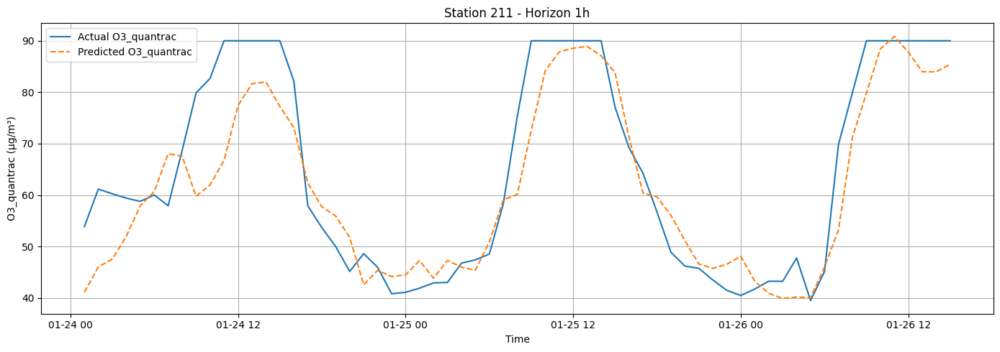

hour = 24
X_test_sid.shape: (60, 81)
y_test_sid.shape: (60, 1)
y_pred_sid.shape: (60,)


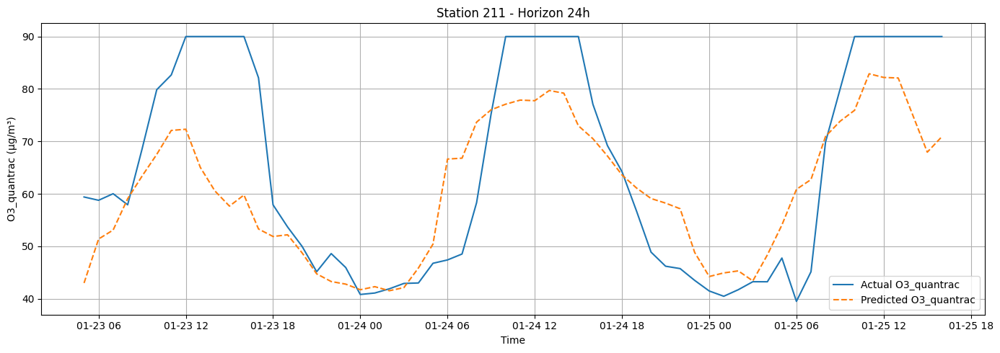

hour = 48
X_test_sid.shape: (56, 81)
y_test_sid.shape: (56, 1)
y_pred_sid.shape: (56,)


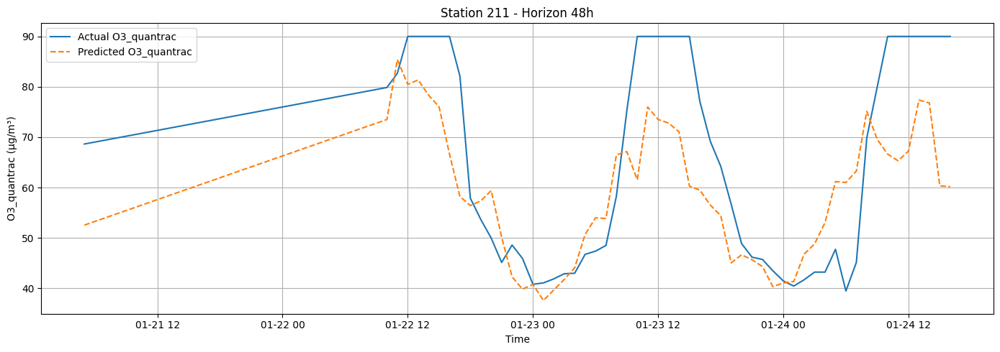

hour = 72
X_test_sid.shape: (53, 81)
y_test_sid.shape: (53, 1)
y_pred_sid.shape: (53,)


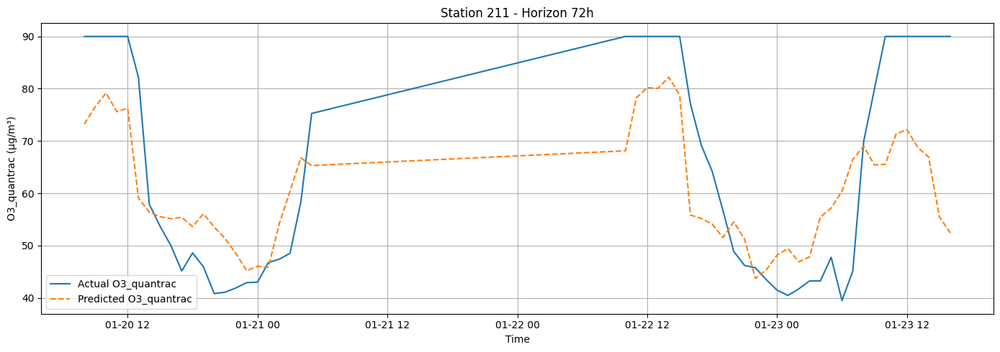

station_id = 212
hour = 1
X_test_sid.shape: (65, 81)
y_test_sid.shape: (65, 1)
y_pred_sid.shape: (65,)


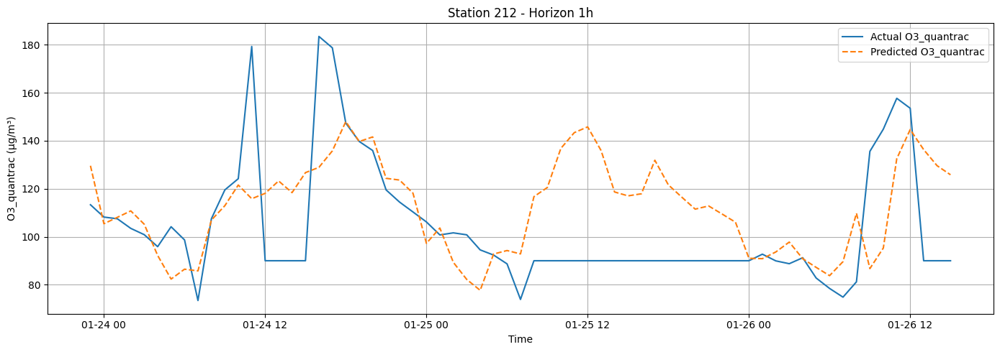

hour = 24
X_test_sid.shape: (61, 81)
y_test_sid.shape: (61, 1)
y_pred_sid.shape: (61,)


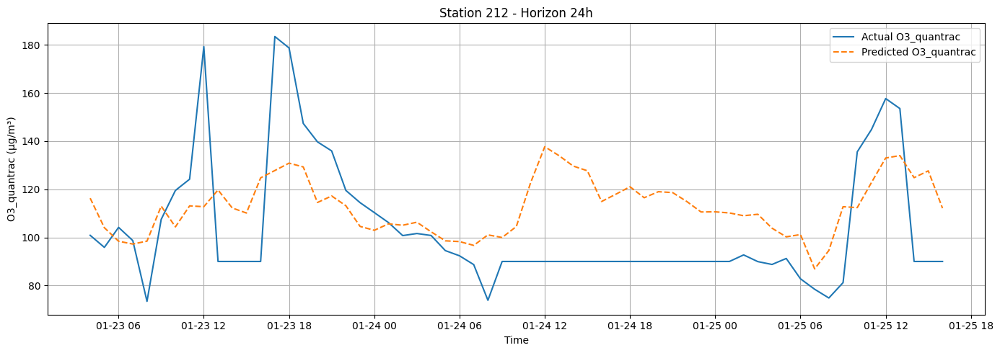

hour = 48
X_test_sid.shape: (57, 81)
y_test_sid.shape: (57, 1)
y_pred_sid.shape: (57,)


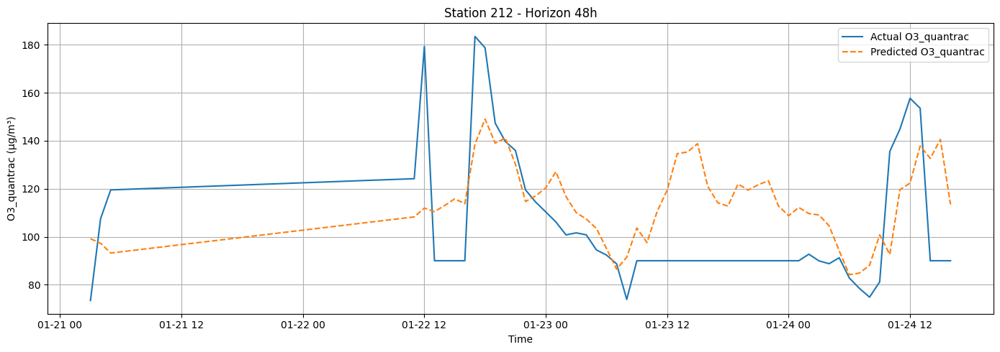

hour = 72
X_test_sid.shape: (54, 81)
y_test_sid.shape: (54, 1)
y_pred_sid.shape: (54,)


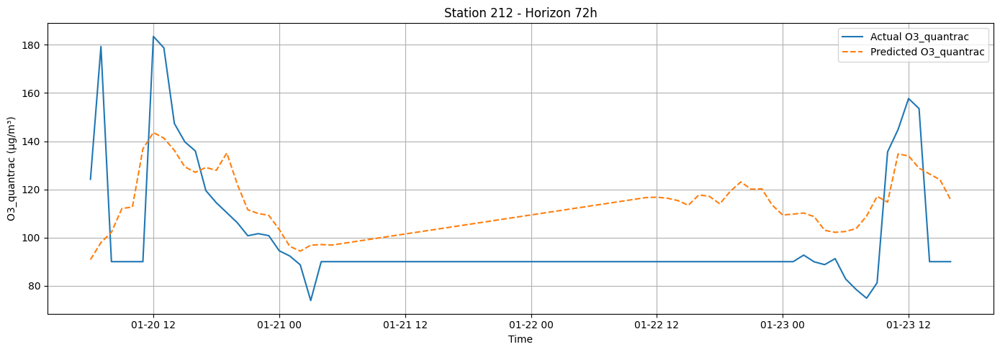

station_id = 213
hour = 1
X_test_sid.shape: (66, 81)
y_test_sid.shape: (66, 1)
y_pred_sid.shape: (66,)


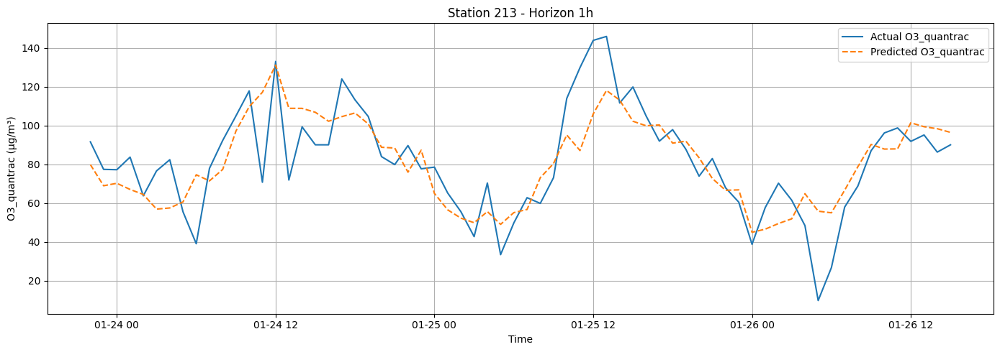

hour = 24
X_test_sid.shape: (62, 81)
y_test_sid.shape: (62, 1)
y_pred_sid.shape: (62,)


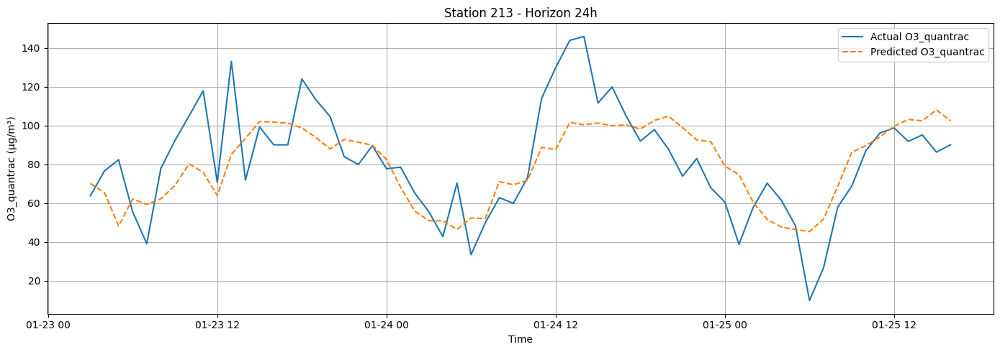

hour = 48
X_test_sid.shape: (59, 81)
y_test_sid.shape: (59, 1)
y_pred_sid.shape: (59,)


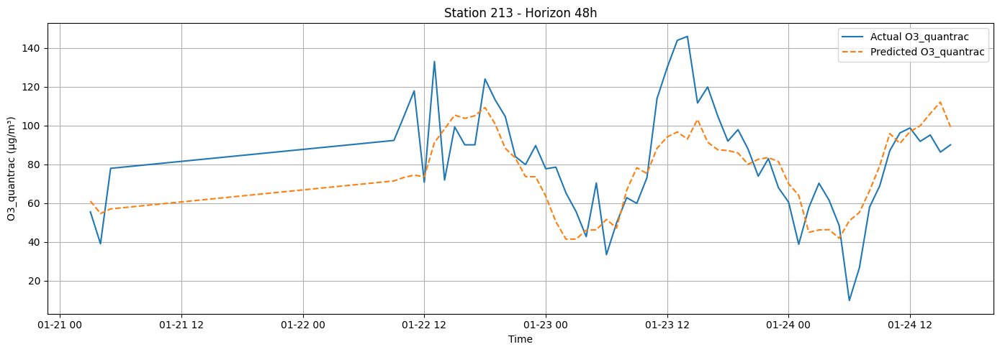

hour = 72
X_test_sid.shape: (55, 81)
y_test_sid.shape: (55, 1)
y_pred_sid.shape: (55,)


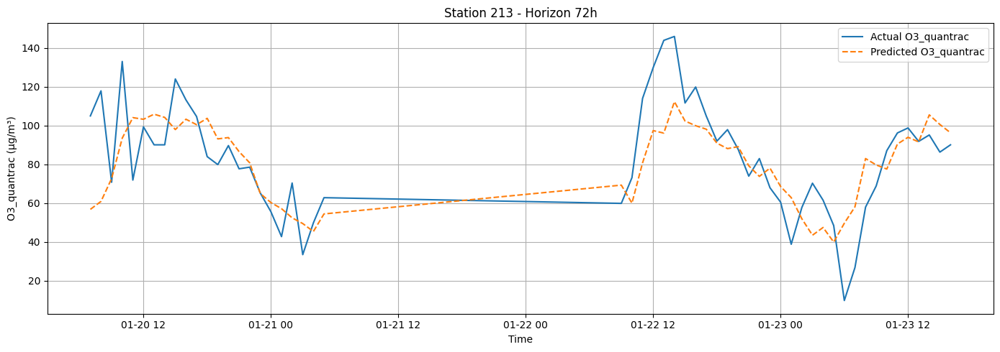

station_id = 216
hour = 1
X_test_sid.shape: (992, 81)
y_test_sid.shape: (992, 1)
y_pred_sid.shape: (992,)


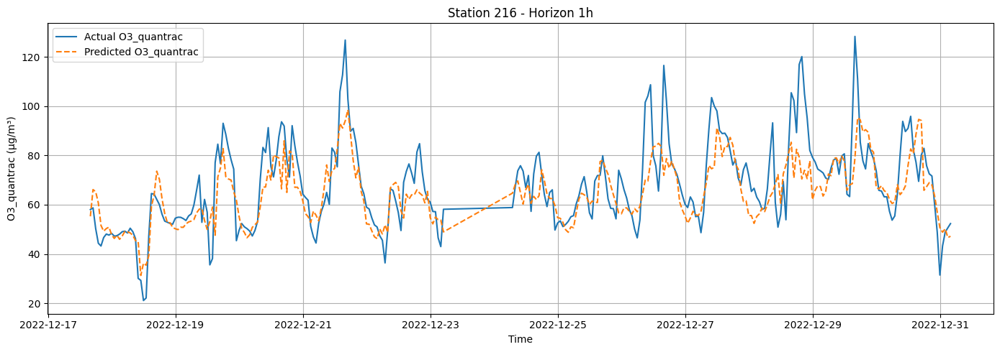

hour = 24
X_test_sid.shape: (988, 81)
y_test_sid.shape: (988, 1)
y_pred_sid.shape: (988,)


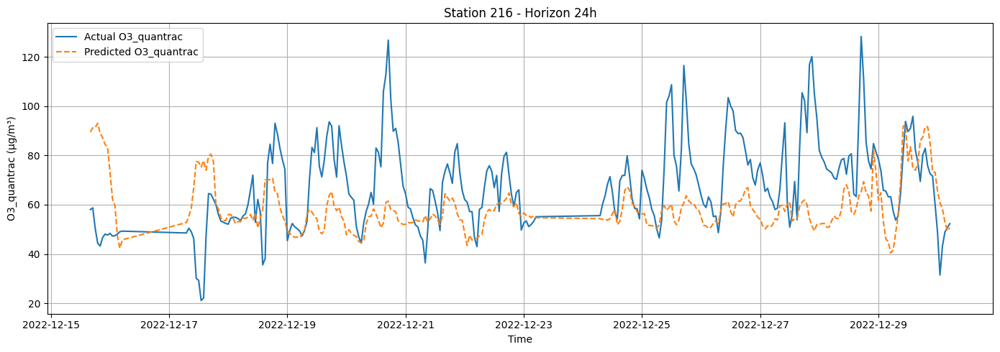

hour = 48
X_test_sid.shape: (984, 81)
y_test_sid.shape: (984, 1)
y_pred_sid.shape: (984,)


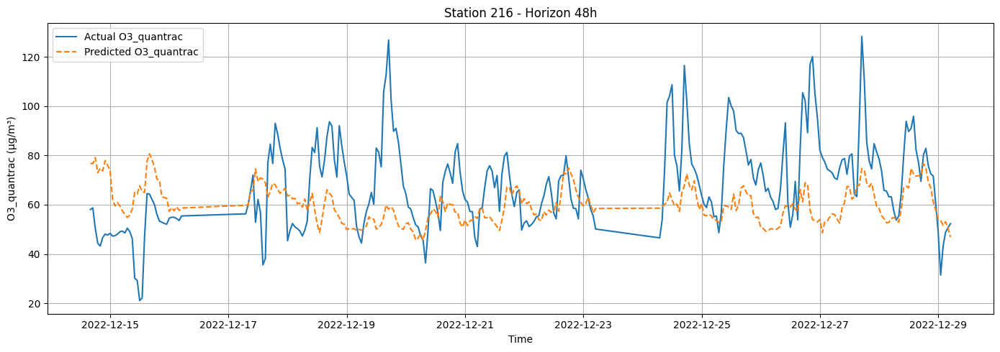

hour = 72
X_test_sid.shape: (981, 81)
y_test_sid.shape: (981, 1)
y_pred_sid.shape: (981,)


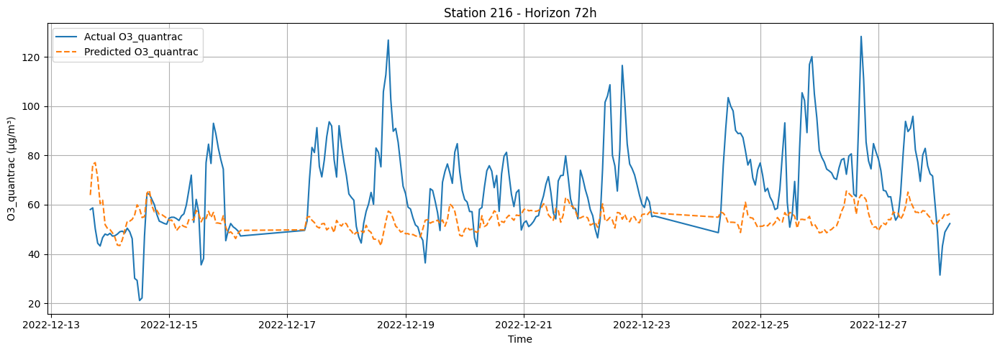

In [22]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for CO

In [23]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
co_station_to_embedding, _ = learn_station_embeddings(df_co, target_col=label, station_col="station_id", embed_dim=4)
df_co, _ = attach_station_embedding(df_co, co_station_to_embedding, station_col="station_id")
print(co_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_pmcmaq_station_embedding.pkl"), 'wb') as co_emb_file:
    pickle.dump(co_station_to_embedding, co_emb_file)

# Print dataset
display(df_co)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_pmcmaq_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
co_df_metrics_all

[Embed] epoch 001 | train MSE=2206906.5507 | val MSE=2265690.5000
[Embed] epoch 010 | train MSE=2202611.8429 | val MSE=2261066.2500
[Embed] epoch 020 | train MSE=2193819.6317 | val MSE=2251566.2500
[Embed] epoch 030 | train MSE=2177639.4548 | val MSE=2234340.5000
[Embed] epoch 040 | train MSE=2152093.7916 | val MSE=2207554.7500
[Embed] epoch 050 | train MSE=2117276.6235 | val MSE=2171436.5000
{211: [-0.055360876, -1.3425553, -1.9094042, 0.7907378], 212: [-1.2046578, -3.949267, -2.7311485, 1.1712998], 213: [-2.7475128, -1.1678884, -3.1978402, 1.4862558], 216: [-2.72049, -3.3912082, -3.586258, 3.665666]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,NO2_cmaq,O3_cmaq,SO2_cmaq,...,CO_quantrac_roll24_mean,CO_quantrac_roll24_std,CO_quantrac_roll48_mean,CO_quantrac_roll48_std,CO_quantrac_roll72_mean,CO_quantrac_roll72_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2022-01-01 10:00:00,90.000000,15.700000,75.109218,721.196900,30.676667,53.673333,0.075893,95.109490,0.149078,...,NaN,NaN,NaN,NaN,NaN,NaN,-0.055361,-1.342555,-1.909404,0.790738
1,2022-01-01 11:00:00,74.207348,15.650000,77.767804,722.056400,32.168333,49.080000,0.063087,57.721016,0.122092,...,721.196900,NaN,721.196900,NaN,721.196900,NaN,-0.055361,-1.342555,-1.909404,0.790738
2,2022-01-01 12:00:00,74.890246,11.833333,72.086817,709.030200,31.860000,49.410000,0.068737,55.009452,0.085674,...,721.626650,0.607758,721.626650,0.607758,721.626650,0.607758,-0.055361,-1.342555,-1.909404,0.790738
3,2022-01-01 13:00:00,79.595678,7.900000,67.509674,703.414800,31.395000,50.456667,0.076458,56.294395,0.075980,...,717.427833,7.285250,717.427833,7.285250,717.427833,7.285250,-0.055361,-1.342555,-1.909404,0.790738
4,2022-01-01 14:00:00,77.621284,8.366667,70.440426,708.858300,31.781667,51.025000,0.082672,56.840809,0.071788,...,713.924575,9.191002,713.924575,9.191002,713.924575,9.191002,-0.055361,-1.342555,-1.909404,0.790738
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8175,2022-12-31 01:00:00,92.346548,17.709259,31.425926,945.048148,26.659259,64.601852,4.285888,51.784937,0.389183,...,1930.118692,1051.387077,1740.859355,948.643557,1877.187277,880.859623,-2.720490,-3.391208,-3.586258,3.665666
8176,2022-12-31 02:00:00,119.184217,22.803390,43.220339,822.974780,25.771186,66.067797,4.157322,51.295325,0.386550,...,1939.356804,1041.247690,1745.153661,944.468857,1872.938395,884.652423,-2.720490,-3.391208,-3.586258,3.665666
8177,2022-12-31 03:00:00,130.034960,23.031667,48.866667,855.703933,25.178333,68.278333,4.235773,51.130547,0.394695,...,1948.144078,1030.392870,1747.963969,941.452442,1852.079455,891.526659,-2.720490,-3.391208,-3.586258,3.665666
8178,2022-12-31 04:00:00,121.654720,22.331667,50.633333,708.340133,24.950000,68.225000,5.047855,51.640614,0.435544,...,1959.166100,1016.568473,1756.607016,931.043799,1831.539056,897.270926,-2.720490,-3.391208,-3.586258,3.665666



===== Training LightGBM for horizon = 1h, target_col = CO_quantrac =====

X.shape = (7888, 83)
y.shape = (7888, 3)

Number of features: 83

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_

,date,target
0,2022-01-24,729.958492
1,2022-01-25,726.078542
2,2022-01-26,735.275817


,date,target
0,2022-01-24,746.068809
1,2022-01-25,735.502762
2,2022-01-26,732.108960


sid = 212, grp =                    date  station_id  y_true      y_pred
781 2022-01-23 23:00:00         212    90.0   67.111813
782 2022-01-24 00:00:00         212    90.0  110.928446
783 2022-01-24 01:00:00         212    90.0  155.479887
784 2022-01-24 02:00:00         212    90.0  119.593400
785 2022-01-24 03:00:00         212    90.0   99.336554
..                  ...         ...     ...         ...
841 2022-01-26 11:00:00         212     0.0   71.926625
842 2022-01-26 12:00:00         212     0.0  128.511236
843 2022-01-26 13:00:00         212    90.0   89.316346
844 2022-01-26 14:00:00         212    90.0   96.554446
845 2022-01-26 15:00:00         212    90.0   93.834368

[65 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 1
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, number of records = 24
Current date =

,date,target
0,2022-01-24,90.000
1,2022-01-25,90.000
2,2022-01-26,73.125


,date,target
0,2022-01-24,96.043792
1,2022-01-25,84.836457
2,2022-01-26,93.536999


sid = 213, grp =                     date  station_id       y_true      y_pred
1215 2022-01-23 22:00:00         213   861.792000  922.437683
1216 2022-01-23 23:00:00         213   726.946000  767.696261
1217 2022-01-24 00:00:00         213   604.021035  706.244412
1218 2022-01-24 01:00:00         213   587.516000  648.894337
1219 2022-01-24 02:00:00         213   536.519000  719.134345
...                  ...         ...          ...         ...
1276 2022-01-26 11:00:00         213   829.513000  937.716574
1277 2022-01-26 12:00:00         213   732.485000  891.232301
1278 2022-01-26 13:00:00         213   747.001000  872.810587
1279 2022-01-26 14:00:00         213  1143.517000  856.763957
1280 2022-01-26 15:00:00         213  1573.294286  960.410654

[66 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25), datetime.date(2022, 1, 26)]
Current date = 2022-01-23, number of records = 2
Current date = 2022-01-24, number of recor

,date,target
0,2022-01-24,889.395948
1,2022-01-25,1050.019481
2,2022-01-26,1049.143300


,date,target
0,2022-01-24,956.894108
1,2022-01-25,998.342992
2,2022-01-26,900.554704


sid = 216, grp =                     date  station_id       y_true       y_pred
6896 2022-11-13 01:00:00         216  2591.768000  1341.555520
6897 2022-11-13 02:00:00         216  2275.251200  1412.159059
6898 2022-11-13 03:00:00         216  2242.949667  1477.889166
6899 2022-11-13 04:00:00         216  2221.351600  1438.491171
6900 2022-11-13 05:00:00         216  2456.063333  1800.835588
...                  ...         ...          ...          ...
7883 2022-12-31 00:00:00         216   945.048148  1321.342196
7884 2022-12-31 01:00:00         216   822.974780  1007.974632
7885 2022-12-31 02:00:00         216   855.703933  1063.437565
7886 2022-12-31 03:00:00         216   708.340133   907.115201
7887 2022-12-31 04:00:00         216   712.736200   969.100092

[992 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(2022, 11, 18), datetime.date(20

,date,target
0,2022-11-13,1872.483406
1,2022-11-14,2026.329407
2,2022-11-15,1610.506747
3,2022-11-16,1890.999392
4,2022-11-17,2043.596463
5,2022-11-19,1994.195255
6,2022-11-20,1044.054037
7,2022-11-21,1815.842549
8,2022-11-22,1833.806263
9,2022-11-23,1401.498884


,date,target
0,2022-11-13,1553.084002
1,2022-11-14,1625.643500
2,2022-11-15,1615.346241
3,2022-11-16,1743.119091
4,2022-11-17,1749.232920
5,2022-11-19,1608.099326
6,2022-11-20,1363.346539
7,2022-11-21,1592.041290
8,2022-11-22,1953.646062
9,2022-11-23,1831.144013


Overall test metrics: {'rmse': 592.29, 'mae': 394.88, 'mape': 27.59, 'mnbe': -8.57, 'r': 0.77, 'n_samples': 1186}

===== Training LightGBM for horizon = 24h, target_col = CO_quantrac =====

X.shape = (7796, 83)
y.shape = (7796, 3)

Number of features: 83

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_

,date,target
0,2022-01-23,731.093322
1,2022-01-24,725.977471
2,2022-01-25,733.546575


,date,target
0,2022-01-23,811.495373
1,2022-01-24,808.925281
2,2022-01-25,806.934596


sid = 212, grp =                    date  station_id  y_true      y_pred
739 2022-01-23 04:00:00         212    90.0  240.339990
740 2022-01-23 05:00:00         212    90.0  222.676152
741 2022-01-23 06:00:00         212    90.0  244.374030
742 2022-01-23 07:00:00         212    90.0  244.374030
743 2022-01-23 08:00:00         212    90.0  250.922031
..                  ...         ...     ...         ...
795 2022-01-25 12:00:00         212     0.0  222.676152
796 2022-01-25 13:00:00         212     0.0  222.676152
797 2022-01-25 14:00:00         212    90.0  222.676152
798 2022-01-25 15:00:00         212    90.0  222.676152
799 2022-01-25 16:00:00         212    90.0  222.676152

[61 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-23, number of records = 20
Current date = 2022-01-24, number of records = 24
Current date = 2022-01-25, number of records = 17


,date,target
0,2022-01-23,90.000000
1,2022-01-24,90.000000
2,2022-01-25,74.117647


,date,target
0,2022-01-23,234.072630
1,2022-01-24,228.414320
2,2022-01-25,226.832349


sid = 213, grp =                     date  station_id       y_true       y_pred
1150 2022-01-23 03:00:00         213   536.519000  1265.321193
1151 2022-01-23 04:00:00         213   535.373000  1211.300728
1152 2022-01-23 05:00:00         213   780.617000  1214.758438
1153 2022-01-23 06:00:00         213  1316.945000  1033.376268
1154 2022-01-23 07:00:00         213    90.000000  1219.262196
...                  ...         ...          ...          ...
1207 2022-01-25 12:00:00         213   829.513000  1008.777665
1208 2022-01-25 13:00:00         213   732.485000   997.636173
1209 2022-01-25 14:00:00         213   747.001000  1059.693313
1210 2022-01-25 15:00:00         213  1143.517000  1090.976016
1211 2022-01-25 16:00:00         213  1573.294286  1151.960547

[62 rows x 4 columns]
uniq_date = [datetime.date(2022, 1, 23), datetime.date(2022, 1, 24), datetime.date(2022, 1, 25)]
Current date = 2022-01-23, number of records = 21
Current date = 2022-01-24, number of records = 24
Current

,date,target
0,2022-01-23,926.324035
1,2022-01-24,1045.316106
2,2022-01-25,1035.313812


,date,target
0,2022-01-23,1142.162375
1,2022-01-24,1156.366680
2,2022-01-25,1080.056202


sid = 216, grp =                     date  station_id       y_true       y_pred
6808 2022-11-12 06:00:00         216  2456.063333  1562.473329
6809 2022-11-12 07:00:00         216  3243.723800  1468.729242
6810 2022-11-12 08:00:00         216  2903.315333  1379.299994
6811 2022-11-12 09:00:00         216  2083.735600  1493.902025
6812 2022-11-12 10:00:00         216  1510.526733  1654.870330
...                  ...         ...          ...          ...
7791 2022-12-30 01:00:00         216   945.048148   948.974026
7792 2022-12-30 02:00:00         216   822.974780   977.215146
7793 2022-12-30 03:00:00         216   855.703933   881.987921
7794 2022-12-30 04:00:00         216   708.340133  1062.757853
7795 2022-12-30 05:00:00         216   712.736200   929.606161

[988 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(2022, 11, 16), datetime.date(2022, 11, 17), datetime.date(20

,date,target
0,2022-11-12,1822.966022
1,2022-11-13,2005.374121
2,2022-11-14,1604.376847
3,2022-11-15,1907.930619
4,2022-11-16,1993.105408
5,2022-11-17,1879.621533
6,2022-11-19,1133.836663
7,2022-11-20,1790.477563
8,2022-11-21,1811.817966
9,2022-11-22,1441.915620


,date,target
0,2022-11-12,1564.099801
1,2022-11-13,1326.525686
2,2022-11-14,1403.585805
3,2022-11-15,1350.199488
4,2022-11-16,1370.424990
5,2022-11-17,1406.630855
6,2022-11-19,1426.948957
7,2022-11-20,1414.727974
8,2022-11-21,1371.042829
9,2022-11-22,1432.164006


Overall test metrics: {'rmse': 805.05, 'mae': 535.13, 'mape': 41.56, 'mnbe': -10.16, 'r': 0.59, 'n_samples': 1171}

===== Training LightGBM for horizon = 48h, target_col = CO_quantrac =====

X.shape = (7700, 83)
y.shape = (7700, 3)

Number of features: 83

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac

,date,target
0,2022-01-22,727.260616
1,2022-01-23,725.977471
2,2022-01-24,733.546575


,date,target
0,2022-01-22,883.413627
1,2022-01-23,883.413627
2,2022-01-24,883.413627


sid = 212, grp =                    date  station_id  y_true      y_pred
695 2022-01-21 03:00:00         212    90.0  379.043736
696 2022-01-21 04:00:00         212    90.0  379.043736
697 2022-01-21 05:00:00         212    90.0  379.043736
698 2022-01-22 11:00:00         212    90.0  379.043736
699 2022-01-22 12:00:00         212    90.0  379.043736
700 2022-01-22 13:00:00         212    90.0  379.043736
701 2022-01-22 14:00:00         212    90.0  379.043736
702 2022-01-22 15:00:00         212    90.0  379.043736
703 2022-01-22 16:00:00         212    90.0  379.043736
704 2022-01-22 17:00:00         212    90.0  379.043736
705 2022-01-22 18:00:00         212    90.0  379.043736
706 2022-01-22 19:00:00         212    90.0  379.043736
707 2022-01-22 20:00:00         212    90.0  379.043736
708 2022-01-22 21:00:00         212    90.0  379.043736
709 2022-01-22 22:00:00         212    90.0  379.043736
710 2022-01-22 23:00:00         212    90.0  379.043736
711 2022-01-23 00:00:00        

,date,target
0,2022-01-22,90.000000
1,2022-01-23,90.000000
2,2022-01-24,74.117647


,date,target
0,2022-01-22,379.043736
1,2022-01-23,379.043736
2,2022-01-24,379.043736


sid = 213, grp =                     date  station_id       y_true       y_pred
1081 2022-01-21 03:00:00         213  1316.945000  1036.924410
1082 2022-01-21 04:00:00         213    90.000000   975.410195
1083 2022-01-21 05:00:00         213    90.000000  1115.613746
1084 2022-01-22 09:00:00         213    90.000000  1318.306248
1085 2022-01-22 10:00:00         213  1496.867000  1131.014942
1086 2022-01-22 11:00:00         213  1470.509000  1153.334731
1087 2022-01-22 12:00:00         213  1432.691000  1226.798358
1088 2022-01-22 13:00:00         213  1306.842105  1156.500748
1089 2022-01-22 14:00:00         213   987.763846  1139.372620
1090 2022-01-22 15:00:00         213   958.607778  1090.088732
1091 2022-01-22 16:00:00         213  1115.249000  1123.830908
1092 2022-01-22 17:00:00         213  1139.888000  1125.325116
1093 2022-01-22 18:00:00         213  1358.010000  1254.028882
1094 2022-01-22 19:00:00         213  1063.488000  1352.748096
1095 2022-01-22 20:00:00         213  

,date,target
0,2022-01-22,1073.556715
1,2022-01-23,1045.316106
2,2022-01-24,1035.313812


,date,target
0,2022-01-22,1200.119160
1,2022-01-23,1225.730907
2,2022-01-24,1048.757172


sid = 216, grp =                     date  station_id       y_true       y_pred
6716 2022-11-10 16:00:00         216  1510.526733  1314.559144
6717 2022-11-10 17:00:00         216  1282.695800  1416.041219
6718 2022-11-10 18:00:00         216   963.120867  1516.596150
6719 2022-11-10 19:00:00         216   903.678400  1398.940460
6720 2022-11-10 20:00:00         216  1004.214533  1409.387733
...                  ...         ...          ...          ...
7695 2022-12-29 01:00:00         216   945.048148  1144.619789
7696 2022-12-29 02:00:00         216   822.974780  1074.763966
7697 2022-12-29 03:00:00         216   855.703933  1120.662621
7698 2022-12-29 04:00:00         216   708.340133  1191.247417
7699 2022-12-29 05:00:00         216   712.736200  1290.002780

[984 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(2022, 11, 15), datetime.date(20

,date,target
0,2022-11-12,2005.374121
1,2022-11-13,1604.376847
2,2022-11-14,1907.930619
3,2022-11-15,1993.105408
4,2022-11-16,1879.621533
5,2022-11-17,1044.054037
6,2022-11-19,2281.929624
7,2022-11-20,1811.817966
8,2022-11-21,1441.915620
9,2022-11-22,1256.955968


,date,target
0,2022-11-12,1302.611676
1,2022-11-13,1307.251571
2,2022-11-14,1311.046987
3,2022-11-15,1364.846714
4,2022-11-16,1330.332126
5,2022-11-17,1317.617724
6,2022-11-19,1366.116797
7,2022-11-20,1390.538914
8,2022-11-21,1291.850319
9,2022-11-22,1289.402811


Overall test metrics: {'rmse': 863.48, 'mae': 588.14, 'mape': 51.38, 'mnbe': -15.88, 'r': 0.53, 'n_samples': 1156}

===== Training LightGBM for horizon = 72h, target_col = CO_quantrac =====

X.shape = (7604, 83)
y.shape = (7604, 3)

Number of features: 83

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
NO2_cmaq
O3_cmaq
SO2_cmaq
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac

,date,target
0,2022-01-20,724.480439
1,2022-01-22,732.130286
2,2022-01-23,733.546575


,date,target
0,2022-01-20,813.441603
1,2022-01-22,814.462945
2,2022-01-23,815.026553


sid = 212, grp =                    date  station_id  y_true      y_pred
650 2022-01-20 06:00:00         212    90.0  244.702861
651 2022-01-20 07:00:00         212    90.0  244.702861
652 2022-01-20 08:00:00         212    90.0  244.702861
653 2022-01-20 09:00:00         212    90.0  244.702861
654 2022-01-20 10:00:00         212    90.0  244.702861
655 2022-01-20 11:00:00         212    90.0  244.702861
656 2022-01-20 12:00:00         212    90.0  244.702861
657 2022-01-20 13:00:00         212    90.0  244.702861
658 2022-01-20 14:00:00         212    90.0  244.702861
659 2022-01-20 15:00:00         212    90.0  244.702861
660 2022-01-20 16:00:00         212    90.0  244.702861
661 2022-01-20 17:00:00         212    90.0  244.702861
662 2022-01-20 18:00:00         212    90.0  244.702861
663 2022-01-20 19:00:00         212    90.0  244.702861
664 2022-01-20 20:00:00         212    90.0  244.702861
665 2022-01-20 21:00:00         212    90.0  244.702861
666 2022-01-20 22:00:00        

,date,target
0,2022-01-20,90.000000
1,2022-01-22,90.000000
2,2022-01-23,74.117647


,date,target
0,2022-01-20,244.702861
1,2022-01-22,245.269796
2,2022-01-23,244.702861


sid = 213, grp =                     date  station_id       y_true       y_pred
1013 2022-01-20 07:00:00         213  1496.867000  1124.364260
1014 2022-01-20 08:00:00         213  1470.509000  1192.281919
1015 2022-01-20 09:00:00         213  1432.691000  1211.891121
1016 2022-01-20 10:00:00         213  1306.842105  1230.735820
1017 2022-01-20 11:00:00         213   987.763846  1072.791707
1018 2022-01-20 12:00:00         213   958.607778  1041.447963
1019 2022-01-20 13:00:00         213  1115.249000  1066.873904
1020 2022-01-20 14:00:00         213  1139.888000  1039.546616
1021 2022-01-20 15:00:00         213  1358.010000  1058.673730
1022 2022-01-20 16:00:00         213  1063.488000  1156.874046
1023 2022-01-20 17:00:00         213  1035.220000  1273.214348
1024 2022-01-20 18:00:00         213   969.898000  1303.118374
1025 2022-01-20 19:00:00         213   923.103000  1186.393783
1026 2022-01-20 20:00:00         213   755.214000  1139.221387
1027 2022-01-20 21:00:00         213  

,date,target
0,2022-01-20,1056.389017
1,2022-01-22,1089.018333
2,2022-01-23,1035.313812


,date,target
0,2022-01-20,1134.995991
1,2022-01-22,1134.598530
2,2022-01-23,1169.203652


sid = 216, grp =                     date  station_id       y_true       y_pred
6623 2022-11-09 19:00:00         216   903.678400  1383.966743
6624 2022-11-09 20:00:00         216  1004.214533  1439.694318
6625 2022-11-09 21:00:00         216  1479.180867  1302.551739
6626 2022-11-09 22:00:00         216  2320.167533  1300.112415
6627 2022-11-09 23:00:00         216  3132.484200  1393.074427
...                  ...         ...          ...          ...
7599 2022-12-28 01:00:00         216   945.048148  1261.248914
7600 2022-12-28 02:00:00         216   822.974780  1189.663061
7601 2022-12-28 03:00:00         216   855.703933  1268.660551
7602 2022-12-28 04:00:00         216   708.340133  1340.792341
7603 2022-12-28 05:00:00         216   712.736200  1422.357185

[981 rows x 4 columns]
uniq_date = [datetime.date(2022, 11, 9), datetime.date(2022, 11, 10), datetime.date(2022, 11, 11), datetime.date(2022, 11, 12), datetime.date(2022, 11, 13), datetime.date(2022, 11, 14), datetime.date(202

,date,target
0,2022-11-10,1767.442988
1,2022-11-12,1604.376847
2,2022-11-13,1907.930619
3,2022-11-14,1993.105408
4,2022-11-15,1879.621533
5,2022-11-16,1044.054037
6,2022-11-17,1815.842549
7,2022-11-19,2205.619108
8,2022-11-20,1441.915620
9,2022-11-21,1256.955968


,date,target
0,2022-11-10,1324.705664
1,2022-11-12,1327.439434
2,2022-11-13,1353.435679
3,2022-11-14,1308.312728
4,2022-11-15,1357.260098
5,2022-11-16,1420.299413
6,2022-11-17,1362.033927
7,2022-11-19,1548.088197
8,2022-11-20,1361.907171
9,2022-11-21,1279.937569


Overall test metrics: {'rmse': 870.24, 'mae': 590.57, 'mape': 41.61, 'mnbe': -5.66, 'r': 0.49, 'n_samples': 1143}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,25.54,19.75,2.69,-1.25,0.41,63,-1.02
4,211,24,83.10,80.38,11.11,-11.00,0.10,60,-10.81
8,211,48,156.94,155.04,21.41,-21.41,NaN,56,-21.20
12,211,72,87.40,84.98,11.75,-11.67,0.39,53,-11.54
1,212,1,31.56,21.50,19.87,-0.64,-0.05,65,-9.63
5,212,24,145.70,144.25,155.78,-155.78,0.16,61,-173.31
9,212,48,294.47,293.78,321.16,-321.16,NaN,57,-351.24
13,212,72,161.16,159.84,172.05,-172.05,0.03,54,-191.52
2,213,1,327.38,244.29,59.25,-39.40,0.43,66,3.83
6,213,24,426.80,332.55,92.00,-78.02,-0.46,62,-12.75


station_id = 211
hour = 1
X_test_sid.shape: (63, 81)
y_test_sid.shape: (63, 1)
y_pred_sid.shape: (63,)


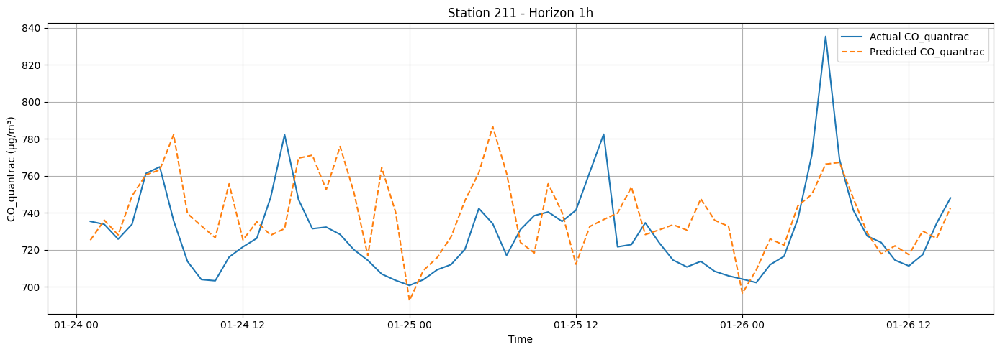

hour = 24
X_test_sid.shape: (60, 81)
y_test_sid.shape: (60, 1)
y_pred_sid.shape: (60,)


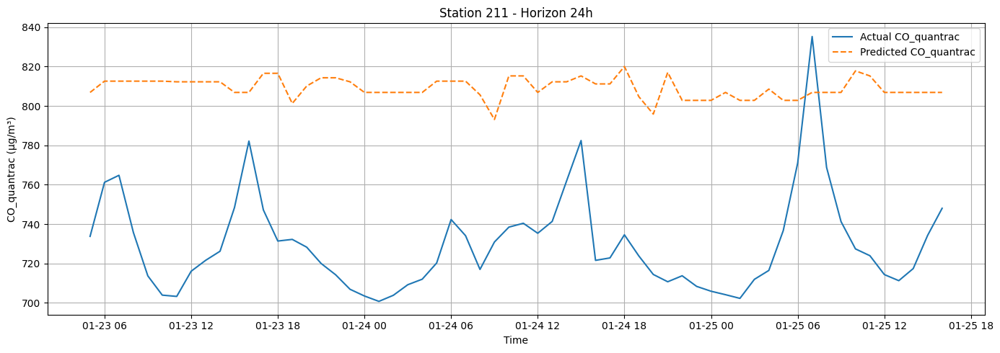

hour = 48
X_test_sid.shape: (56, 81)
y_test_sid.shape: (56, 1)
y_pred_sid.shape: (56,)


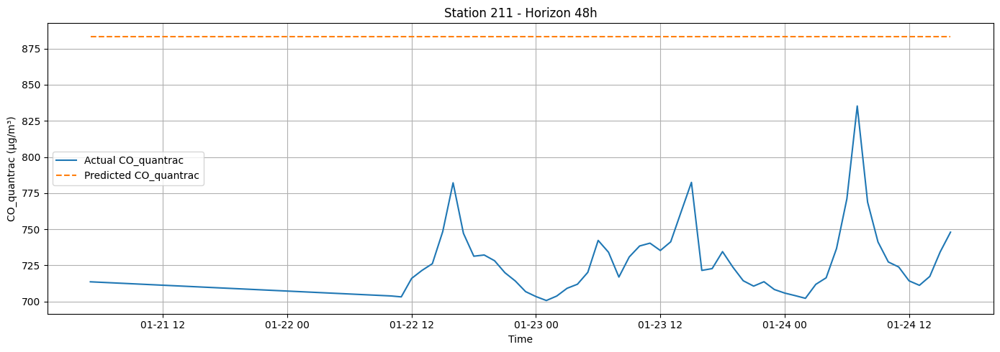

hour = 72
X_test_sid.shape: (53, 81)
y_test_sid.shape: (53, 1)
y_pred_sid.shape: (53,)


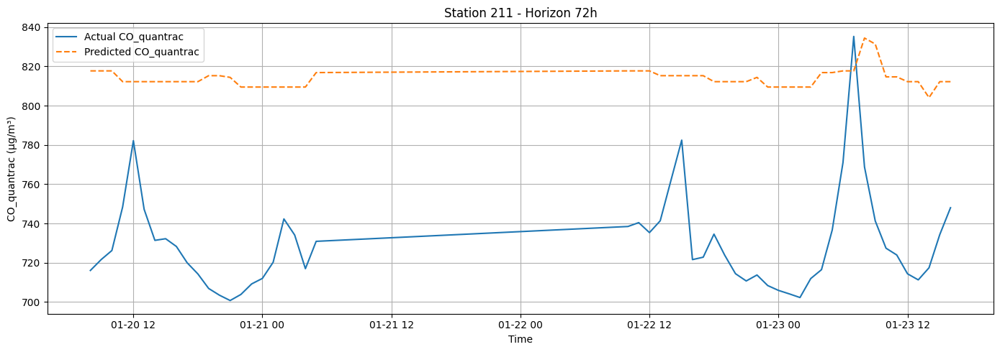

station_id = 212
hour = 1
X_test_sid.shape: (65, 81)
y_test_sid.shape: (65, 1)
y_pred_sid.shape: (65,)


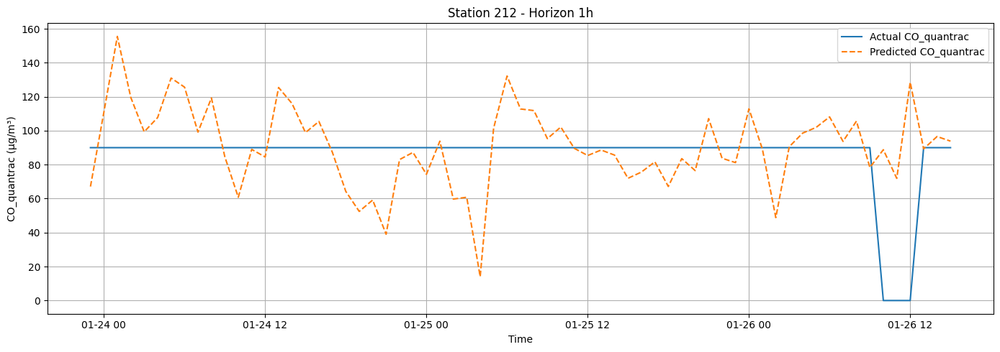

hour = 24
X_test_sid.shape: (61, 81)
y_test_sid.shape: (61, 1)
y_pred_sid.shape: (61,)


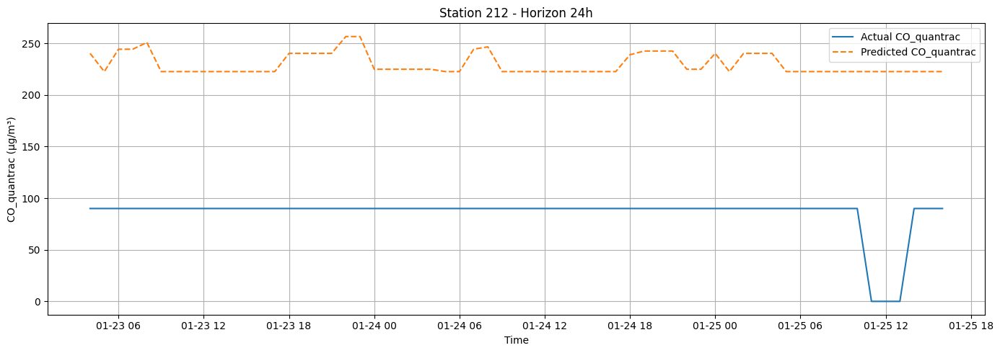

hour = 48
X_test_sid.shape: (57, 81)
y_test_sid.shape: (57, 1)
y_pred_sid.shape: (57,)


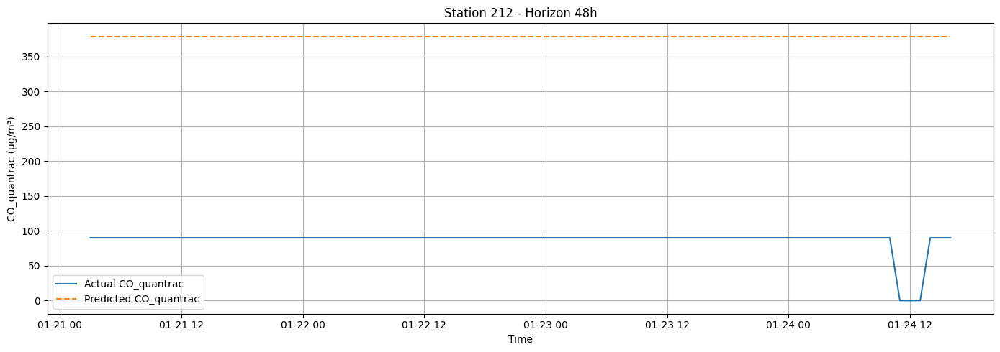

hour = 72
X_test_sid.shape: (54, 81)
y_test_sid.shape: (54, 1)
y_pred_sid.shape: (54,)


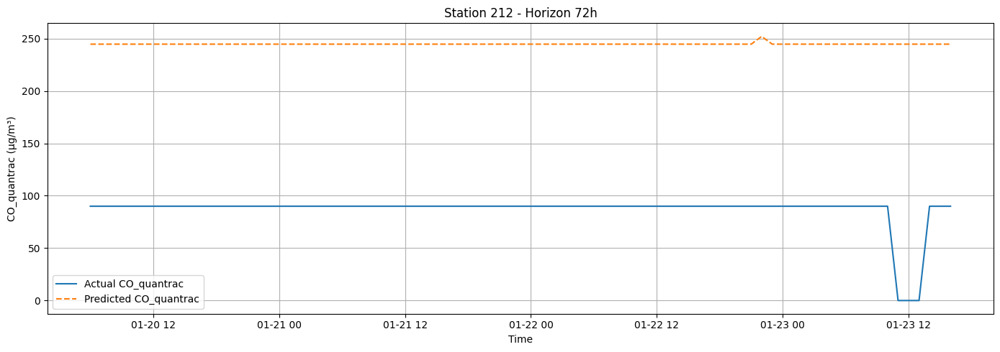

station_id = 213
hour = 1
X_test_sid.shape: (66, 81)
y_test_sid.shape: (66, 1)
y_pred_sid.shape: (66,)


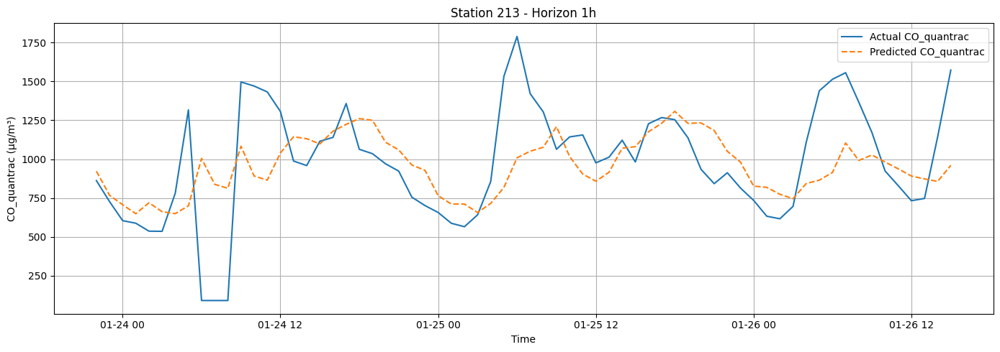

hour = 24
X_test_sid.shape: (62, 81)
y_test_sid.shape: (62, 1)
y_pred_sid.shape: (62,)


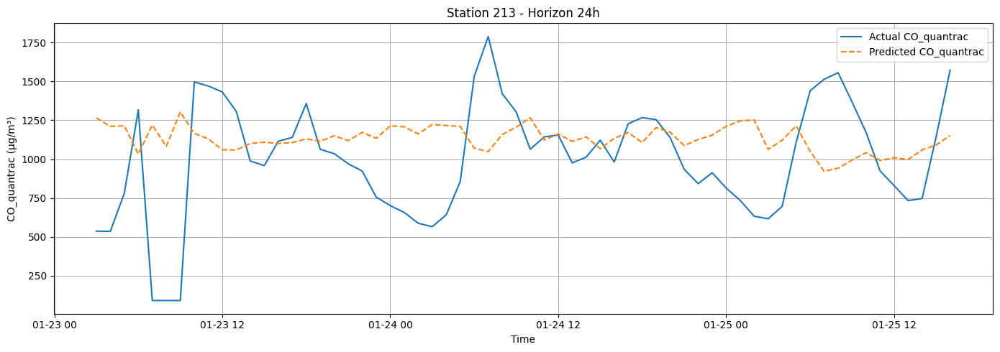

hour = 48
X_test_sid.shape: (59, 81)
y_test_sid.shape: (59, 1)
y_pred_sid.shape: (59,)


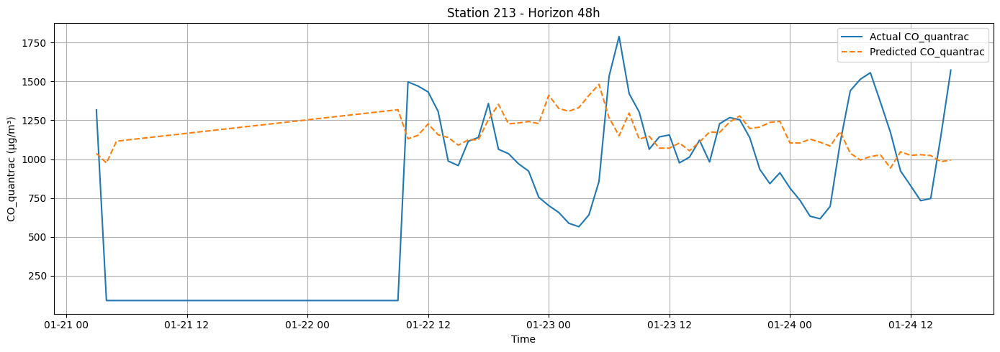

hour = 72
X_test_sid.shape: (55, 81)
y_test_sid.shape: (55, 1)
y_pred_sid.shape: (55,)


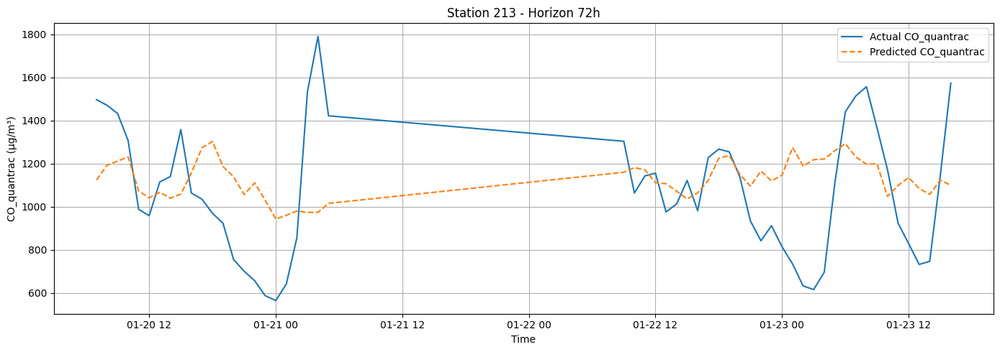

station_id = 216
hour = 1
X_test_sid.shape: (992, 81)
y_test_sid.shape: (992, 1)
y_pred_sid.shape: (992,)


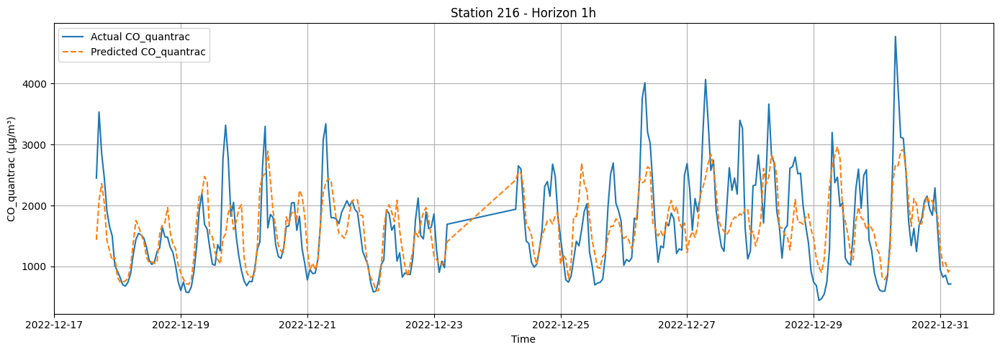

hour = 24
X_test_sid.shape: (988, 81)
y_test_sid.shape: (988, 1)
y_pred_sid.shape: (988,)


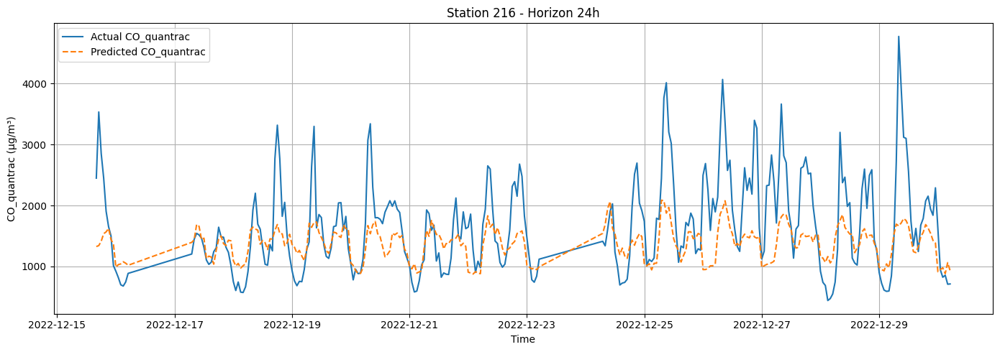

hour = 48
X_test_sid.shape: (984, 81)
y_test_sid.shape: (984, 1)
y_pred_sid.shape: (984,)


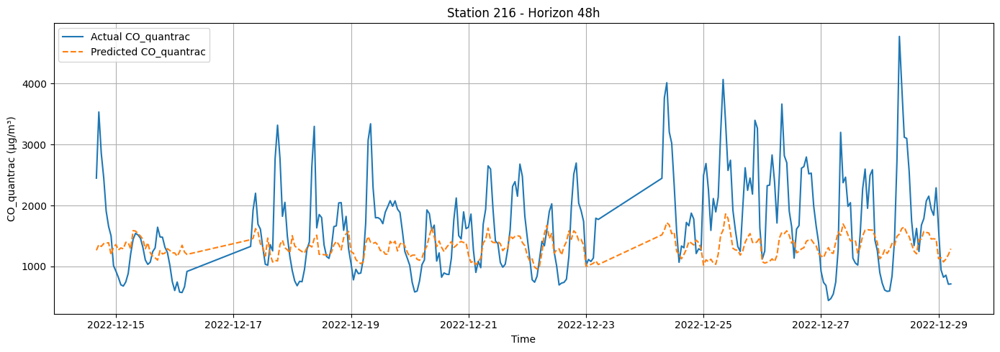

hour = 72
X_test_sid.shape: (981, 81)
y_test_sid.shape: (981, 1)
y_pred_sid.shape: (981,)


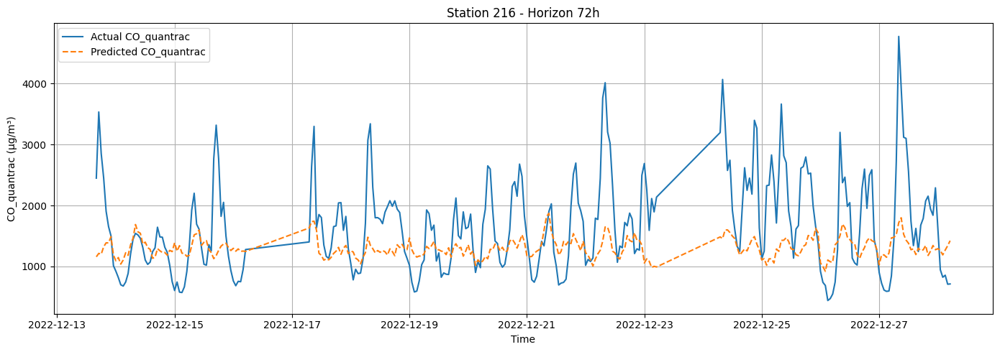

In [24]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)